In [1]:
import numpy as np
from pathlib import Path


def make_point_clouds(n_samples_per_shape: int, n_points: int, noise: float):
    """Make point clouds for circles, spheres, and tori with random noise.
    """
    circle_point_clouds = [
        np.asarray(
            [
                [np.sin(t) + noise * (np.random.rand(1)[0] - 0.5), np.cos(t) + noise * (np.random.rand(1)[0] - 0.5), 0]
                for t in range((n_points ** 2))
            ]
        )
        for kk in range(n_samples_per_shape)
    ]
    # label circles with 0
    circle_labels = np.zeros(n_samples_per_shape)

    sphere_point_clouds = [
        np.asarray(
            [
                [
                    np.cos(s) * np.cos(t) + noise * (np.random.rand(1)[0] - 0.5),
                    np.cos(s) * np.sin(t) + noise * (np.random.rand(1)[0] - 0.5),
                    np.sin(s) + noise * (np.random.rand(1)[0] - 0.5),
                ]
                for t in range(n_points)
                for s in range(n_points)
            ]
        )
        for kk in range(n_samples_per_shape)
    ]
    # label spheres with 1
    sphere_labels = np.ones(n_samples_per_shape)

    torus_point_clouds = [
        np.asarray(
            [
                [
                    (2 + np.cos(s)) * np.cos(t) + noise * (np.random.rand(1)[0] - 0.5),
                    (2 + np.cos(s)) * np.sin(t) + noise * (np.random.rand(1)[0] - 0.5),
                    np.sin(s) + noise * (np.random.rand(1)[0] - 0.5),
                ]
                for t in range(n_points)
                for s in range(n_points)
            ]
        )
        for kk in range(n_samples_per_shape)
    ]
    # label tori with 2
    torus_labels = 2 * np.ones(n_samples_per_shape)

    point_clouds = np.concatenate((circle_point_clouds, sphere_point_clouds, torus_point_clouds))
    labels = np.concatenate((circle_labels, sphere_labels, torus_labels))

    return point_clouds, labels

In [2]:
n_samples_per_class = 10
point_clouds, labels = make_point_clouds(n_samples_per_class, 10, 0.1)
point_clouds.shape
print(f"There are {point_clouds.shape[0]} point clouds in {point_clouds.shape[2]} dimensions, "
      f"each with {point_clouds.shape[1]} points.")

There are 30 point clouds in 3 dimensions, each with 100 points.


In [3]:
from gtda.homology import VietorisRipsPersistence

VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2])  # Parameter explained in the text
diagrams = VR.fit_transform(point_clouds)
diagrams.shape

(30, 175, 3)

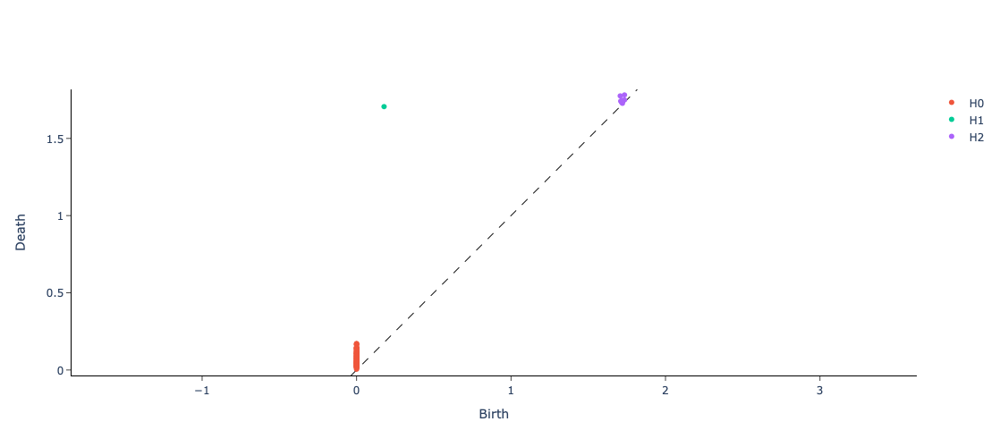

In [4]:
from gtda.plotting import plot_diagram

i = 0
plot_diagram(diagrams[i])

In [5]:
from functional.homology import diagrams
from estimators.base import BaseEstimator

class Barcode(BaseEstimator):
    def __init__(self, maxdim: int = 1, treat_as_distances: bool = False):
        super().__init__()
        self.maxdim = maxdim
        self.treat_as_distances = treat_as_distances

    def fit_transform(self, X: np.ndarray, y=None):
        return [diagrams(X[b], maxdim=self.maxdim, distances=self.treat_as_distances) for b in range(X.shape[0])]

In [6]:
VR = Barcode()
diag = VR.fit_transform(point_clouds)
len(diag)

30

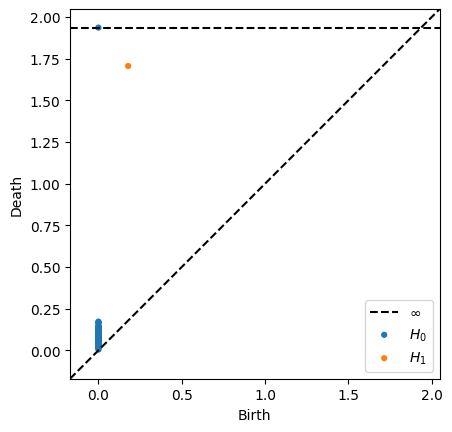

In [9]:
from utils.tensorboard import plot_persistence

import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

plot_persistence(diag[i])

In [18]:
from functional.homology import persistence_entropy

class PersistenceEntropy(BaseEstimator):
    def __init__(self):
        super().__init__()

    def fit_transform(self, X, y=None):
        return np.array([persistence_entropy(X[b]) for b in range(len(X))])

In [13]:
PE = PersistenceEntropy()
features = PE.fit_transform(diag)

In [15]:
features = np.array(features)

In [16]:
features

array([[4.4273181e+00, 0.0000000e+00],
       [4.4373989e+00, 8.7490501e-03],
       [4.4233932e+00, 0.0000000e+00],
       [4.4781055e+00, 3.8836647e-03],
       [4.4428859e+00, 0.0000000e+00],
       [4.4567904e+00, 6.7288458e-02],
       [4.4511719e+00, 8.3815446e-03],
       [4.4471068e+00, 3.4891818e-02],
       [4.4546351e+00, 5.5260614e-02],
       [4.4496727e+00, 0.0000000e+00],
       [4.5132008e+00, 3.0657666e+00],
       [4.5039616e+00, 3.1374698e+00],
       [4.5192814e+00, 3.1157866e+00],
       [4.5057077e+00, 3.0679026e+00],
       [4.5070019e+00, 3.1158144e+00],
       [4.5063996e+00, 2.9732895e+00],
       [4.5158815e+00, 3.1268759e+00],
       [4.5130720e+00, 3.1790752e+00],
       [4.5181203e+00, 3.1666467e+00],
       [4.5148907e+00, 3.0923510e+00],
       [4.4897757e+00, 3.3360369e+00],
       [4.4827032e+00, 3.3294530e+00],
       [4.4793410e+00, 3.3224449e+00],
       [4.4804115e+00, 3.3220463e+00],
       [4.4783716e+00, 3.2788413e+00],
       [4.4925799e+00, 3.

In [17]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(features, labels)
model = RandomForestClassifier()
model.fit(X_train, y_train)
model.score(X_valid, y_valid)

1.0

In [19]:
from sklearn.pipeline import make_pipeline

steps = [Barcode(),
         PersistenceEntropy(),
         RandomForestClassifier()]
pipeline = make_pipeline(*steps)

pcs_train, pcs_valid, labels_train, labels_valid = train_test_split(point_clouds, labels)

pipeline.fit(pcs_train, labels_train)

pipeline.score(pcs_valid, labels_valid)

TypeError: All intermediate steps should be transformers and implement fit and transform or be the string 'passthrough' 'Barcode()' (type <class '__main__.Barcode'>) doesn't

In [6]:
from fairseq.checkpoint_utils import load_model_ensemble_and_task_from_hf_hub
from fairseq.models.text_to_speech.hub_interface import TTSHubInterface


models, cfg, task = load_model_ensemble_and_task_from_hf_hub(
    "facebook/fastspeech2-en-200_speaker-cv4",
    arg_overrides={"vocoder": "hifigan", "fp16": False}
)
model = models
TTSHubInterface.update_cfg_with_data_cfg(cfg, task.data_cfg)
generator = task.build_generator(model, cfg)

text = "Hello, this is a test run."

sample = TTSHubInterface.get_model_input(task, text)
wav, rate = TTSHubInterface.get_prediction(task, model, generator, sample)

Fetching 9 files:   0%|          | 0/9 [00:00<?, ?it/s]

2024-05-20 11:08:55 | INFO | fairseq.tasks.speech_to_text | dictionary size (vocab.txt): 74
2024-05-20 11:08:56 | INFO | fairseq.models.text_to_speech.vocoder | loaded HiFiGAN checkpoint from /Users/andrew/.cache/fairseq/models--facebook--fastspeech2-en-200_speaker-cv4/snapshots/e0218c23f36ee17ddef548a1ec04efe6ced9370c/hifigan.bin
2024-05-20 11:08:56 | INFO | fairseq.models.text_to_speech.vocoder | loaded HiFiGAN checkpoint from /Users/andrew/.cache/fairseq/models--facebook--fastspeech2-en-200_speaker-cv4/snapshots/e0218c23f36ee17ddef548a1ec04efe6ced9370c/hifigan.bin


AttributeError: 'list' object has no attribute 'eval'

In [5]:
%pip install huggingface_hub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 401.2/401.2 kB 2.3 MB/s eta 0:00:0000:0100:01
DEPRECATION: omegaconf 2.0.6 has a non-standard dependency specifier PyYAML>=5.1.*. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of omegaconf or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063
Note: you may need to restart the kernel to use updated packages.


In [3]:
%pip install g2p-en

  Using cached Distance-0.1.3-py3-none-any.whl
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 8.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 11.7 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.9/97.9 kB 3.5 MB/s eta 0:00:00
DEPRECATION: omegaconf 2.0.6 has a non-standard dependency specifier PyYAML>=5.1.*. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of omegaconf or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063
Note: you may need to restart the kernel to use updated packages.


In [104]:
from fairseq.checkpoint_utils import load_model_ensemble_and_task_from_hf_hub
from fairseq.models.text_to_speech.hub_interface import TTSHubInterface


models, cfg, task = load_model_ensemble_and_task_from_hf_hub(
    "facebook/fastspeech2-en-200_speaker-cv4",
    arg_overrides={"vocoder": "hifigan", "fp16": False}
)
model = models[0]
# TTSHubInterface.update_cfg_with_data_cfg(cfg, task.data_cfg)
# generator = task.build_generator(models, cfg)

# text = "Hello, this is a test run."

# sample = TTSHubInterface.get_model_input(task, text)
# wav, rate = TTSHubInterface.get_prediction(task, model, generator, sample)

Fetching 9 files:   0%|          | 0/9 [00:00<?, ?it/s]

2024-05-23 11:38:22 | INFO | fairseq.tasks.speech_to_text | dictionary size (vocab.txt): 74
/Users/andrew/PycharmProjects/tadProject/.venv/lib/python3.9/site-packages/torch/nn/utils/weight_norm.py:28: UserWarning:

torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.

2024-05-23 11:38:24 | INFO | fairseq.models.text_to_speech.vocoder | loaded HiFiGAN checkpoint from /Users/andrew/.cache/fairseq/models--facebook--fastspeech2-en-200_speaker-cv4/snapshots/e0218c23f36ee17ddef548a1ec04efe6ced9370c/hifigan.bin


In [2]:
wav.shape

torch.Size([38912])

In [3]:
model.encoder.var_adaptor.embed_pitch, model.encoder.var_adaptor.embed_energy, model.encoder.embed_speaker, model.encoder.embed_tokens

(Embedding(256, 256),
 Embedding(256, 256),
 Embedding(200, 64),
 Embedding(74, 256, padding_idx=1))

In [14]:
import numpy as np
from functional.dimension import mm, mle, local_pca, two_nn, persistence, corr, persistence, pca
from utils.math import mle_aggregate, beta1_intercept
from functional.homology import drop_inf, vr_diagrams, total_persistence, persistence_entropy, betti, euler
from functional.delta import delta_hyperbolicity
from scipy.spatial.distance import pdist

In [17]:
from scipy.stats import mode
emb = model.encoder.embed_speaker.weight.detach().numpy().astype('float32')
# mle_aggregate(mle(emb, 20)), mm(emb, 20).mean(), local_pca(emb, 20).mean(), pca(emb), two_nn(emb), corr(emb)
# diag = diagrams(emb)
# total_persistence(diag, q=1), persistence_entropy(diag).sum(), mode(euler(betti(diag))).mode
delta_hyperbolicity(emb)

2.3428125242694042

In [11]:
def relative_delta_hyperbolicity(X: np.ndarray, distances: bool = False) -> float:
    d = delta_hyperbolicity(X, distances)
    diam = X.max() if distances else pdist(X).max()
    return d / diam

emb = model_lj.encoder.embed_tokens.weight.detach().numpy().astype('float32')
relative_delta_hyperbolicity(emb)

0.12366507906246739

In [16]:
emb = model.encoder.var_adaptor.embed_energy.weight.detach().numpy().astype('float32')
emb.shape

(256, 256)

In [18]:
from sklearn.neighbors import NearestNeighbors


def curvature(X: np.ndarray, k: int):
    nn = NearestNeighbors(n_neighbors=k).fit(X)
    dist, ix = nn.kneighbors()
    dim = mle_aggregate(mle(X, k))
    h = np.power(np.arange(1, k + 1), -1 / (dim + 4))
    rho = np.sum(1 / np.power(h, k) / k * gaussian_kernel_one(dist / h, dim, 1) / k, axis=-1)
    mu = np.arange(1, k + 1) / np.cumsum(1 / rho[ix], axis=-1)
    vol = np.arange(1, k + 1) / mu / (k - 1)
    y = vol / unit_ball_volume(dim) / np.power(dist, dim)
    q = 5 * np.sum(np.square(dist) * (y - 1) * np.diff(dist, prepend=0), axis=-1) / (dist[:, -1] ** 5 - dist[:, 0] ** 5)
    c = -6 * (dim + 2) * q
    return c.mean()

In [35]:
def density(X: np.ndarray, k: int):
    nn = NearestNeighbors(n_neighbors=k).fit(X)
    dist, ix = nn.kneighbors()
    dim = mle_aggregate(mle(X, k))
    h = np.power(np.arange(1, k + 1), -1 / (dim + 4))
    rho = np.sum(1 / np.power(h, k) / k * gaussian_kernel_one(dist / h, dim, 1) / k, axis=-1)
    return rho

In [37]:
from functional.information import entropy

In [42]:
from functional.kernel import gaussian_kernel_one
from utils.math import unit_ball_volume

emb = model_lj.encoder.embed_tokens.weight.detach().numpy().astype('float32')
# emb.shape
entropy(density(emb, 20), np.log), "{:.2e}".format(entropy(density(emb, 20), np.log))

(0.0002405730630692304, '2.41e-04')

In [29]:
from functional.magnitude import magnitude
from scipy.spatial import distance_matrix

emb = model.encoder.var_adaptor.embed_energy.weight.detach().numpy().astype('float32')
d = distance_matrix(emb, emb)
magnitude(d)

45.220349143313435

In [10]:
models, cfg, task = load_model_ensemble_and_task_from_hf_hub(
    "facebook/fastspeech2-en-ljspeech",
    arg_overrides={"vocoder": "hifigan", "fp16": False}
)
model_lj = models[0]
TTSHubInterface.update_cfg_with_data_cfg(cfg, task.data_cfg)
generator = task.build_generator(models, cfg)

text = "Hello, this is a test run."

sample = TTSHubInterface.get_model_input(task, text)
wav, rate = TTSHubInterface.get_prediction(task, model_lj, generator, sample)

Fetching 9 files:   0%|          | 0/9 [00:00<?, ?it/s]

2024-05-21 14:27:26 | INFO | fairseq.tasks.speech_to_text | dictionary size (vocab.txt): 75
/Users/andrew/PycharmProjects/tadProject/.venv/lib/python3.9/site-packages/torch/nn/utils/weight_norm.py:28: UserWarning: torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.
  warnings.warn("torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.")
2024-05-21 14:27:27 | INFO | fairseq.models.text_to_speech.vocoder | loaded HiFiGAN checkpoint from /Users/andrew/.cache/fairseq/models--facebook--fastspeech2-en-ljspeech/snapshots/a3e3e5e2e62bb7ca7514b11aa469e9c5b01a20bf/hifigan.bin


In [30]:
emb = model_lj.encoder.embed_tokens.weight.detach().numpy().astype('float32')
# mle_aggregate(mle(emb, 20)), mm(emb, 20).mean(), local_pca(emb, 20).mean(), pca(emb), two_nn(emb), persistence(emb), corr(emb)
d = distance_matrix(emb, emb)
magnitude(d)

29.50604813484006

In [13]:
model.encoder.var_adaptor.embed_pitch, model.encoder.var_adaptor.embed_energy, model.encoder.embed_speaker, model.encoder.embed_tokens

(Embedding(256, 256),
 Embedding(256, 256),
 Embedding(200, 64),
 Embedding(74, 256, padding_idx=1))

In [14]:
model_lj

FastSpeech2Model(
  (encoder): FastSpeech2Encoder(
    (dropout_module): FairseqDropout()
    (embed_tokens): Embedding(75, 256, padding_idx=1)
    (embed_positions): SinusoidalPositionalEmbedding()
    (encoder_fft_layers): ModuleList(
      (0-3): 4 x FFTLayer(
        (self_attn): MultiheadAttention(
          (dropout_module): FairseqDropout()
          (k_proj): Linear(in_features=256, out_features=256, bias=True)
          (v_proj): Linear(in_features=256, out_features=256, bias=True)
          (q_proj): Linear(in_features=256, out_features=256, bias=True)
          (out_proj): Linear(in_features=256, out_features=256, bias=True)
        )
        (layer_norm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (ffn): PositionwiseFeedForward(
          (ffn): Sequential(
            (0): Conv1d(256, 1024, kernel_size=(9,), stride=(1,), padding=(4,))
            (1): ReLU()
            (2): Conv1d(1024, 256, kernel_size=(9,), stride=(1,), padding=(4,))
          )
     

In [7]:
emb = model.encoder.embed_tokens.weight.detach()
emb

tensor([[-0.0356, -0.0510, -0.0095,  ...,  0.0540, -0.0365,  0.0418],
        [-0.0916,  0.0205,  0.0866,  ...,  0.0121, -0.0654,  0.1078],
        [ 0.1632,  0.0188, -0.1035,  ...,  0.0900,  0.2788, -0.1063],
        ...,
        [ 0.0096, -0.0583,  0.0933,  ...,  0.0655,  0.0033,  0.0304],
        [ 0.0759,  0.2230, -0.0323,  ...,  0.0081, -0.0796, -0.1306],
        [ 0.0384,  0.4087, -0.1053,  ..., -0.0978, -0.2128, -0.1193]])

In [8]:
emb.shape

torch.Size([74, 256])

In [5]:
from functional.delta import c_torch
from nn.modules.hyperbolic import Linear, HypSoftmax, ToPoincare
import torch, torch.nn as nn

In [9]:
c_torch(emb.unsqueeze(0))

tensor([0.0469])

In [75]:
import torch.nn.init as init
from functional.delta import delta_hyperbolicity, mobius_addition_torch, conformal_torch
import math

class HypSoftmax(nn.Module):
    def __init__(self, in_features: int, out_features: int, c: float):
        super().__init__()
        self.P = nn.Parameter(torch.empty((out_features, in_features)), requires_grad=True)
        self.A = nn.Parameter(torch.empty((out_features, in_features)), requires_grad=True)
        self.softmax = nn.Softmax(dim=-1)
        self._c = nn.Parameter(torch.tensor(c), requires_grad=False)

        self.reset_parameters()

    def reset_parameters(self) -> None:
        # Setting a=sqrt(5) in kaiming_uniform is the same as initializing with
        # uniform(-1/sqrt(in_features), 1/sqrt(in_features)). For details, see
        # https://github.com/pytorch/pytorch/issues/57109
        init.kaiming_uniform_(self.P, a=math.sqrt(5))
        init.kaiming_uniform_(self.A, a=math.sqrt(5))

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        num = 2 * self._c * torch.sum(mobius_addition_torch(-self.P.unsqueeze(-2), x, self._c) * self.A.unsqueeze(-2), dim=-1)
        den = (1 - self._c * torch.square(mobius_addition_torch(-self.P, x, self._c)).sum(dim=-1)) * torch.sum(self.A * self.A, dim=-1)
        return self.softmax(
            conformal_torch(self.P, self._c) * torch.norm(self.A, dim=-1) / torch.sqrt(self._c) * torch.asinh(num / den)
        )

In [29]:
from functional.delta import mobius_addition_torch

In [19]:
def exponential_map_torch(x: torch.Tensor, c: float, v: torch.Tensor) -> torch.Tensor:
    return mobius_addition_torch(
        x,
        torch.tanh(torch.sqrt(c) * conformal_torch(x, c) * torch.norm(v, dim=-1) / 2).unsqueeze(-1) * v / torch.sqrt(c) / torch.norm(v, dim=-1).unsqueeze(-1),
        c
    )

In [18]:
from functional.delta import conformal_torch

v = emb
x = torch.rand(256)
c = c_torch(emb.unsqueeze(0))
(torch.tanh(torch.sqrt(c) * conformal_torch(x, c) * torch.norm(v, dim=-1) / 2).unsqueeze(-1) * v).shape

torch.Size([74, 256])

In [31]:
class ToPoincare(nn.Module):
    def __init__(self, c: float, d: int):
        super().__init__()
        self._c = c
        self.x = nn.Parameter(torch.randn((1, d)), requires_grad=True)

    def forward(self, v: torch.Tensor):
        return exponential_map_torch(self.x, self._c, v)

In [32]:
class HypNN(nn.Module):
    def __init__(self, c: float):
        super().__init__()
        self.transform = ToPoincare(c, 256)
        self.linear = Linear(256, 128, c)
        self.softmax = HypSoftmax(128, 2, c)

    def forward(self, v: torch.Tensor):
        return self.softmax(self.linear(self.transform(v)))


model = HypNN(c_torch(emb.unsqueeze(0)))
with torch.no_grad():
    print(model(emb))

RuntimeError: The size of tensor a (256) must match the size of tensor b (74) at non-singleton dimension 1

In [68]:
with torch.no_grad():
    out = Linear(256, 1024, c_torch(emb.unsqueeze(0)).squeeze())(emb)
    print(out.shape)

torch.Size([74, 1024])


In [72]:
with torch.no_grad():
    y = Linear(256, 1024, c_torch(emb.unsqueeze(0)).squeeze())(emb)
    x = -model.softmax.P.unsqueeze(-2)
    num = (1 + 2 * torch.sum(x * y, dim=-1, keepdim=True) + torch.sum(y * y, dim=-1, keepdim=True).unsqueeze(0)) * x + (torch.sum(x * x, dim=-1, keepdim=True)) * y
    print(num.shape)
    den = 1 + 2 * torch.sum(x * y, dim=-1) + torch.sum(x * x, dim=-1) * torch.sum(y * y, dim=-1)
    print(den.shape)

torch.Size([2, 74, 1024])
torch.Size([2, 74])


In [73]:
def mobius_addition_torch(x: torch.Tensor, y: torch.Tensor, c: [torch.Tensor, float]) -> torch.Tensor:
    num = (1 + 2 * c * torch.sum(x * y, dim=-1, keepdim=True) + c * x * torch.sum(y * y, dim=-1, keepdim=True).unsqueeze(0)) + (1 - c * torch.sum(x * x, dim=-1, keepdim=True)) * y
    den = 1 + 2 * c * torch.sum(x * y, dim=-1) + c * c * torch.sum(x * x, dim=-1) * torch.sum(y * y, dim=-1)

    return num / den.unsqueeze(-1)

In [19]:
import torch, torch.nn as nn
from nn.modules.hyperbolic import ToPoincare, Linear, HypSoftmax
from functional.delta import c_torch


class HypNN(nn.Module):
    def __init__(self, c: float):
        super().__init__()
        self.transform = ToPoincare(c, 256)
        self.linear = Linear(256, 128, c)
        self.softmax = HypSoftmax(128, 2, c)

    def forward(self, v: torch.Tensor):
        return self.softmax(self.linear(self.transform(v)))


emb = model.encoder.embed_tokens.weight.detach()
model = HypNN(c_torch(emb.unsqueeze(0)).squeeze())

/Users/andrew/PycharmProjects/tadProject/nn/modules/hyperbolic.py:74: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self._c = nn.Parameter(torch.tensor(c), requires_grad=False)


In [20]:
model

HypNN(
  (transform): ToPoincare()
  (linear): Linear(
    (linear): Linear(in_features=256, out_features=128, bias=False)
  )
  (softmax): HypSoftmax(
    (softmax): Softmax(dim=-2)
  )
)

In [105]:
emb = emb[4:]

In [1]:
import numpy as np

labels = torch.tensor(np.load('vowel_labels.npy').astype('float32'))

NameError: name 'torch' is not defined

In [9]:
from torch.utils.data import SubsetRandomSampler, DataLoader

In [10]:
indices = torch.randperm(emb.shape[0])[:100]
random_dataset = SubsetRandomSampler(emb.shape[0], indices)

random_dataloader = DataLoader(dataset, batch_size=10, shuffle=False, sampler=random_dataset)

In [11]:
next(iter(random_dataloader))

TypeError: object of type 'int' has no len()

In [12]:
from torch import optim

In [58]:
model.train(True)
loss_fn = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
n_epochs = 4000   # number of epochs to run
cons = emb[labels == 0]
vow = emb[labels == 1]

for i in range(n_epochs):
    # basic training loop
    ix1, ix2 = torch.randint(0, cons.shape[0], (5,)), torch.randint(0, vow.shape[0], (5,))
    inputs, ans = torch.vstack([cons[ix1], vow[ix2]]), torch.FloatTensor([0] * 5 + [1] * 5)
    outputs = model(inputs)[1]
    loss = loss_fn(outputs, ans)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if i % 100 == 0:
        acc = (outputs.round() == ans).float().mean()
        print(acc)

print('Finished Training')

tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
Finished Training


In [60]:
ix1, ix2 = torch.randint(0, cons.shape[0], (5,)), torch.randint(0, vow.shape[0], (5,))
inputs, ans = torch.vstack([cons[ix1], vow[ix2]]), torch.FloatTensor([0] * 5 + [1] * 5)
inputs.shape, ans.shape

(torch.Size([10, 256]), torch.Size([10]))

In [61]:
outputs = model(emb)[1]
print((outputs.round() == labels).float().mean())

tensor(0.6714)


In [33]:
labels.mean()

tensor(0.6714)

In [50]:
labels[torch.randint(0, emb.shape[0], (10,))].mean()

tensor(0.3000)

In [67]:
model(emb)[1].round() == labels

tensor([ True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True, False, False,
        False, False,  True,  True,  True,  True,  True,  True,  True,  True,
         True, False, False, False,  True,  True,  True,  True,  True,  True,
        False, False, False, False, False, False,  True,  True,  True,  True,
         True,  True, False, False, False, False, False, False,  True,  True,
         True,  True,  True,  True,  True, False, False,  True, False, False])

In [70]:
ix1, ix2 = torch.randint(0, cons.shape[0], (5,)), torch.randint(0, vow.shape[0], (5,))
inputs, ans = torch.vstack([cons[ix1], vow[ix2]]), torch.FloatTensor([0] * 5 + [1] * 5)
outputs = model(inputs)[1]

outputs.round(), ans

(tensor([0., 0., 0., 0., 0., 1., 1., 1., 1., 1.], grad_fn=<RoundBackward0>),
 tensor([0., 0., 0., 0., 0., 1., 1., 1., 1., 1.]))

In [73]:
outputs = model(torch.vstack([cons, vow]))[1]

In [74]:
outputs.round()

tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       grad_fn=<RoundBackward0>)

In [77]:
inputs = torch.vstack([cons[ix1], vow[ix2]])
model(inputs)[1]

tensor([2.5474e-11, 2.7078e-12, 2.4670e-14, 1.4829e-15, 2.0861e-14, 1.0000e+00,
        1.0000e+00, 1.0000e+00, 1.0000e+00, 1.0000e+00],
       grad_fn=<SelectBackward0>)

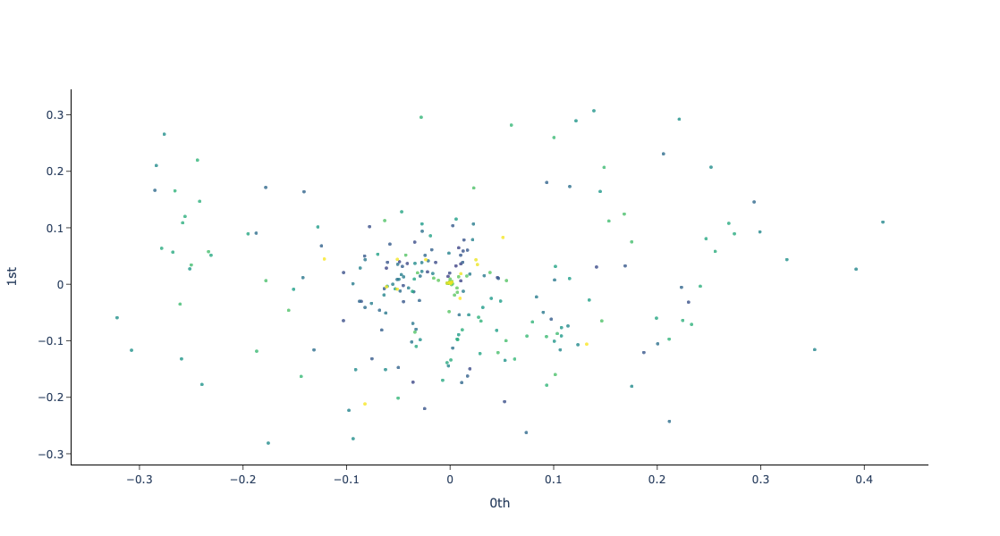

In [2]:
point_clouds = np.load('point_clouds.npy')

from gtda.plotting import plot_point_cloud
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
point_cloud_pca = pca.fit_transform(point_clouds[0])

plot_point_cloud(point_cloud_pca)

In [3]:
Xt = np.load('ph_takens.npy')
Xt.shape

(1395, 1039, 3)

In [106]:
labels = np.load('genders.npy')

In [5]:
from gtda.diagrams import PersistenceEntropy

PE = PersistenceEntropy()
features = PE.fit_transform(Xt)
features.shape

(1395, 3)

In [6]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(features, labels)
model = RandomForestClassifier()
model.fit(X_train, y_train)
model.score(X_valid, y_valid)

0.7965616045845272

In [7]:
from gtda.diagrams import Amplitude

amp = Amplitude()
features = amp.fit_transform(Xt)
X_train, X_valid, y_train, y_valid = train_test_split(features, labels)
model = RandomForestClassifier()
model.fit(X_train, y_train)
model.score(X_valid, y_valid)

0.8166189111747851

In [8]:
specT = np.load('ph_spec.npy')

In [9]:
features = amp.fit_transform(specT)
X_train, X_valid, y_train, y_valid = train_test_split(features, labels)
model = RandomForestClassifier()
model.fit(X_train, y_train)
model.score(X_valid, y_valid)

0.7965616045845272

In [10]:
features = PE.fit_transform(specT)
X_train, X_valid, y_train, y_valid = train_test_split(features, labels)
model = RandomForestClassifier()
model.fit(X_train, y_train)
model.score(X_valid, y_valid)

0.7593123209169055

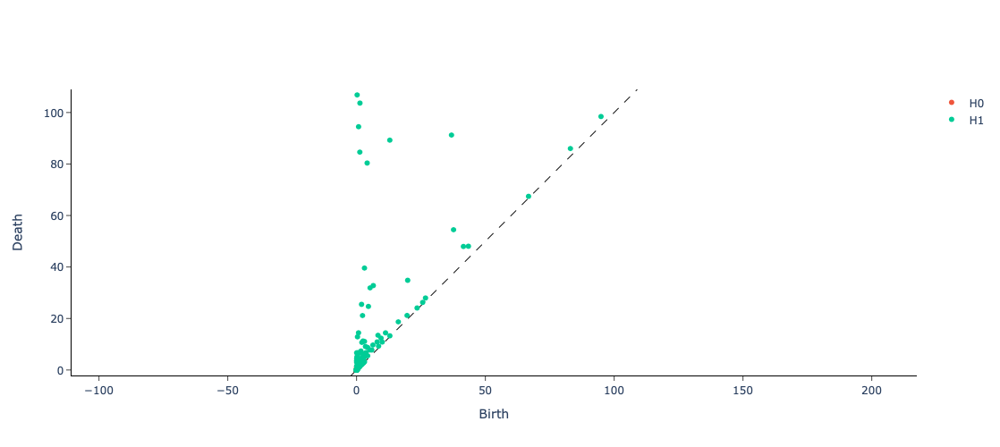

In [12]:
from gtda.plotting import plot_diagram

plot_diagram(specT[0])

In [18]:
X = model.encoder.embed_speaker.weight.numpy(force=True)
n_samples, n_features = X.shape
n_neighbors = 20

In [36]:
from sklearn.decomposition import TruncatedSVD
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomTreesEmbedding
from sklearn.manifold import (
    MDS,
    TSNE,
    Isomap,
    LocallyLinearEmbedding,
    SpectralEmbedding,
)
from sklearn.neighbors import NeighborhoodComponentsAnalysis
from sklearn.pipeline import make_pipeline
from sklearn.random_projection import SparseRandomProjection

embeddings = {
    "Random projection embedding": SparseRandomProjection(
        n_components=2, random_state=42
    ),
    "Truncated SVD embedding": TruncatedSVD(n_components=2),
    "Linear Discriminant Analysis embedding": LinearDiscriminantAnalysis(
        n_components=2
    ),
    "Isomap embedding": Isomap(n_neighbors=n_neighbors, n_components=2),
    "Standard LLE embedding": LocallyLinearEmbedding(
        n_neighbors=n_neighbors, n_components=2, method="standard"
    ),
    "Modified LLE embedding": LocallyLinearEmbedding(
        n_neighbors=n_neighbors, n_components=2, method="modified"
    ),
    "MDS embedding": MDS(n_components=2, n_init=1, max_iter=120, n_jobs=2),
    "Random Trees embedding": make_pipeline(
        RandomTreesEmbedding(n_estimators=200, max_depth=5, random_state=0),
        TruncatedSVD(n_components=2),
    ),
    "Spectral embedding": SpectralEmbedding(
        n_components=2, random_state=0, eigen_solver="arpack"
    ),
    "t-SNE embedding": TSNE(
        n_components=2,
        n_iter=500,
        n_iter_without_progress=150,
        n_jobs=2,
        random_state=0,
    ),
    "NCA embedding": NeighborhoodComponentsAnalysis(
        n_components=2, init="pca", random_state=0
    ),
}

In [22]:
import sklearn
sklearn.__version__

'1.4.1.post1'

In [24]:
for name, transformer in embeddings.items():
    try:
        transformer.fit_transform(X)
    except:
        print(name)

Linear Discriminant Analysis embedding


/Users/andrew/PycharmProjects/tadProject/.venv/lib/python3.9/site-packages/threadpoolctl.py:1186: RuntimeWarning:


Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md




NCA embedding


In [37]:
projections = {}
for name, transformer in embeddings.items():
    if name.startswith("Linear Discriminant Analysis") or name == 'NCA embedding':
        continue

    print(f"Computing {name}...")
    projections[name] = transformer.fit_transform(X)

Computing Random projection embedding...
Computing Truncated SVD embedding...
Computing Isomap embedding...
Computing Standard LLE embedding...
Computing Modified LLE embedding...
Computing MDS embedding...
Computing Random Trees embedding...
Computing Spectral embedding...
Computing t-SNE embedding...


In [38]:
len(embeddings) - 2

9

In [39]:
projections['t-SNE embedding'].shape

(200, 2)

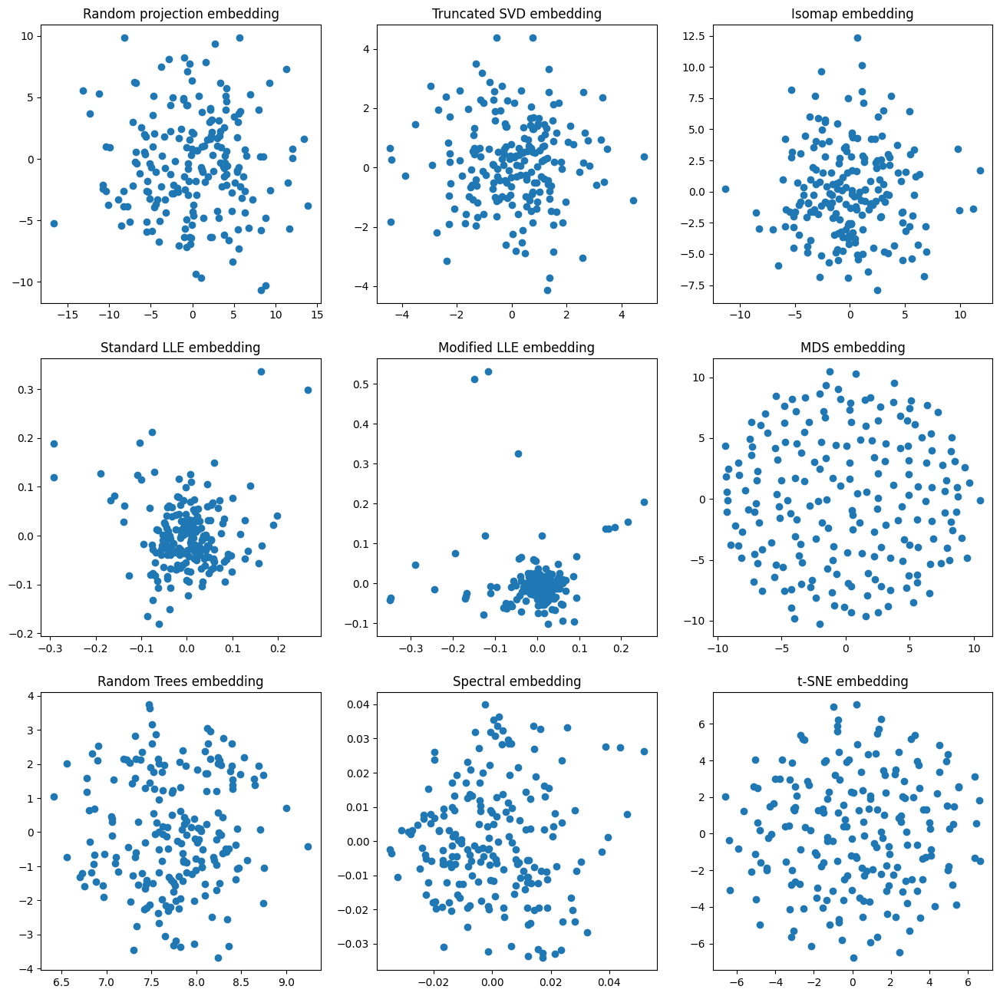

In [42]:
import matplotlib.pyplot as plt

# Create two subplots and unpack the output array immediately
fig = plt.figure(figsize=(16, 16))
axes = fig.subplots(3, 3)

for i, (name, emb) in enumerate(projections.items()):
    axes[i // 3, i % 3].scatter(emb[:, 0], emb[:, 1])
    axes[i // 3, i % 3].set_title(name)

In [43]:
labels = np.load('vowel_labels.npy')
labels.shape

(70,)

In [47]:
X, y = model.encoder.embed_tokens.weight.numpy(force=True)[4:], labels
n_samples, n_features = X.shape
n_neighbors = 5

projections = {}
for name, transformer in embeddings.items():
    if name.startswith("Linear Discriminant Analysis") or name == 'NCA embedding':
        continue

    print(f"Computing {name}...")
    projections[name] = transformer.fit_transform(X)

Computing Random projection embedding...
Computing Truncated SVD embedding...
Computing Isomap embedding...
Computing Standard LLE embedding...
Computing Modified LLE embedding...
Computing MDS embedding...
Computing Random Trees embedding...
Computing Spectral embedding...
Computing t-SNE embedding...


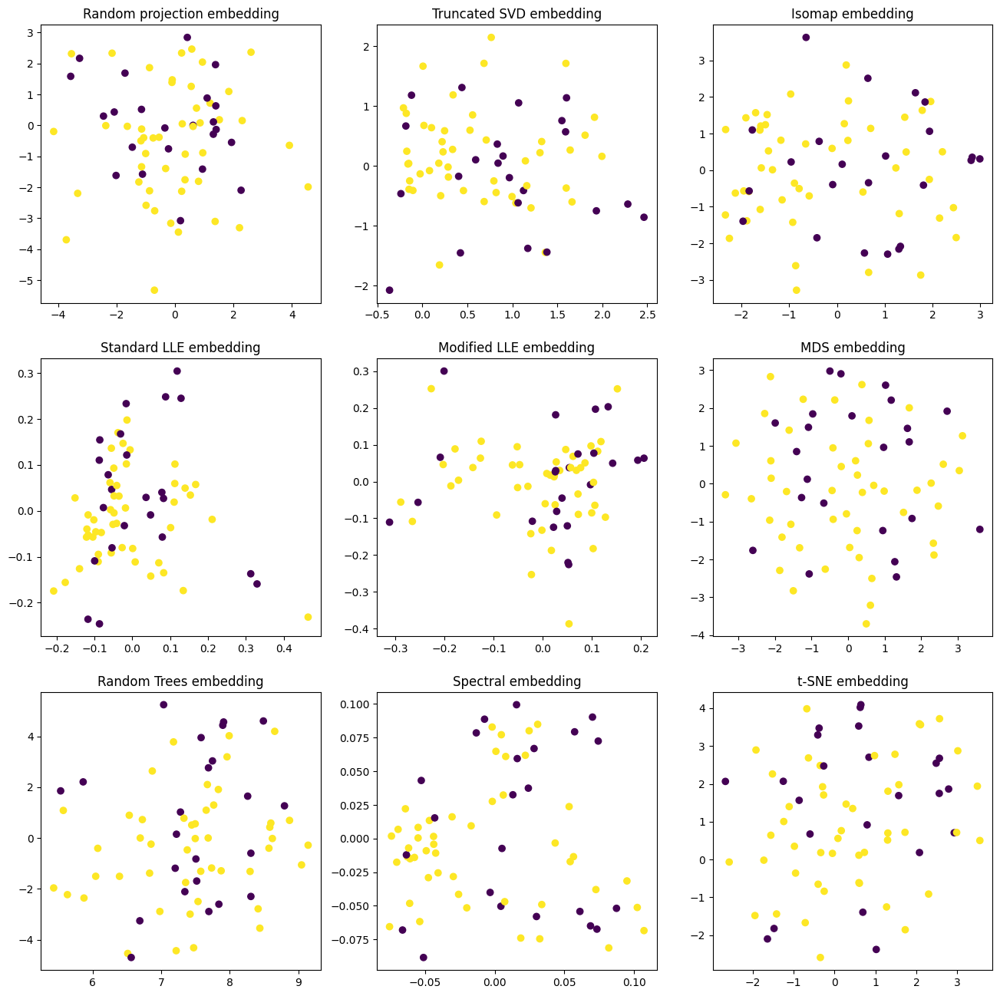

In [48]:
import matplotlib.pyplot as plt

# Create two subplots and unpack the output array immediately
fig = plt.figure(figsize=(16, 16))
axes = fig.subplots(3, 3)

for i, (name, emb) in enumerate(projections.items()):
    axes[i // 3, i % 3].scatter(emb[:, 0], emb[:, 1], c=labels)
    axes[i // 3, i % 3].set_title(name)

In [53]:
import torch, torch.nn as nn
from nn.modules.hyperbolic import ToPoincare, Linear, HypSoftmax
from functional.delta import c_torch


class HypNN(nn.Module):
    def __init__(self, c: float):
        super().__init__()
        self.transform = ToPoincare(c, 256)
        self.linear = Linear(256, 128, c)
        self.softmax = HypSoftmax(128, 2, c)

    def forward(self, v: torch.Tensor):
        return self.softmax(self.linear(self.transform(v)))


emb = model.encoder.embed_tokens.weight.detach()[4:]
model = HypNN(c_torch(emb.unsqueeze(0)).squeeze())

AttributeError: 'HypNN' object has no attribute 'encoder'

In [54]:
emb = emb[4:]

In [50]:
labels = torch.tensor(labels.astype('float32'))
labels

tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 1., 1.,
        1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 0., 0.,
        0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 0., 0., 1., 0., 0.])

In [51]:
from torch import optim

In [55]:
model.train(True)
loss_fn = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
n_epochs = 1000   # number of epochs to run
cons = emb[labels == 0]
vow = emb[labels == 1]

for i in range(n_epochs):
    # basic training loop
    ix1, ix2 = torch.randint(0, cons.shape[0], (5,)), torch.randint(0, vow.shape[0], (5,))
    inputs, ans = torch.vstack([cons[ix1], vow[ix2]]), torch.FloatTensor([0] * 5 + [1] * 5)
    outputs = model(inputs)[1]
    loss = loss_fn(outputs, ans)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if i % 200 == 0:
        acc = (outputs.round() == ans).float().mean()
        print(acc)

print('Finished Training')

tensor(0.5000)
tensor(0.9000)
tensor(1.)
tensor(1.)
tensor(1.)
Finished Training


In [56]:
model.transform(emb).shape

torch.Size([1, 70, 256])

In [80]:
transformed = model.transform(emb).squeeze()

for i in range(emb.shape[0]):
    t = model.transform(emb[i].unsqueeze(0)).squeeze()
    print(torch.square(transformed[i] - t).sum())

AttributeError: 'numpy.ndarray' object has no attribute 'layout'

In [81]:
X, y = transformed.numpy(force=True), np.load('vowel_labels.npy')
n_samples, n_features = X.shape
n_neighbors = 5

projections = {}
for name, transformer in embeddings.items():
    if name.startswith("Linear Discriminant Analysis") or name == 'NCA embedding':
        continue

    print(f"Computing {name}...")
    projections[name] = transformer.fit_transform(X)

Computing Random projection embedding...
Computing Truncated SVD embedding...
Computing Isomap embedding...
Computing Standard LLE embedding...
Computing Modified LLE embedding...
Computing MDS embedding...
Computing Random Trees embedding...
Computing Spectral embedding...
Computing t-SNE embedding...


In [82]:
transformed.shape

torch.Size([70, 256])

In [83]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

In [91]:
import matplotlib.pyplot as plt

# Create two subplots and unpack the output array immediately
fig = plt.figure(figsize=(16, 16))
axes = fig.subplots(3, 3)

for i, (name, emb) in enumerate(projections.items()):
    axes[i // 3, i % 3].scatter(emb[:, 0], emb[:, 1], c=labels)
    axes[i // 3, i % 3].set_title(name)

plt.savefig("tokens.png")

<Figure size 640x480 with 0 Axes>

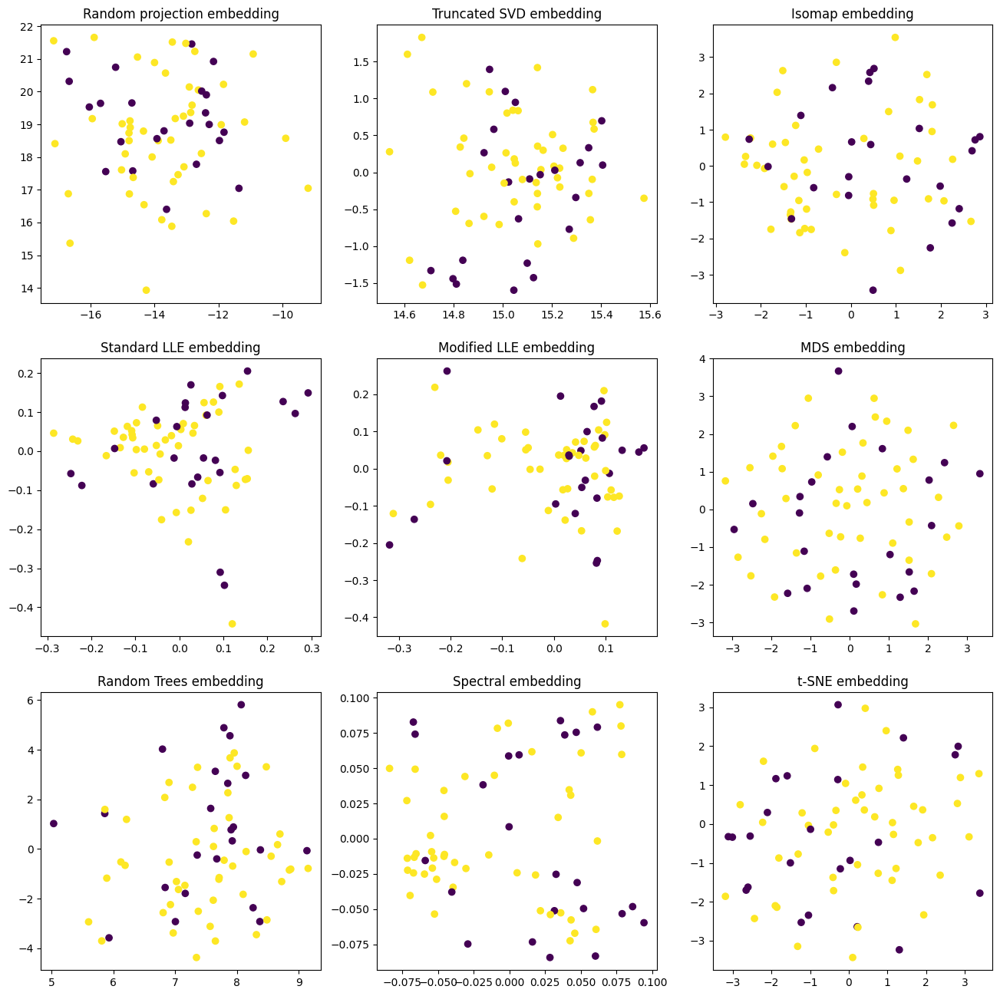

In [90]:
plt.show()

In [63]:
from sklearn.decomposition import PCA

p = PCA(n_components=2).fit_transform(X)
p.shape

(70, 2)

In [64]:
plt.scatter(p[:, 0], p[:, 1], c=labels)

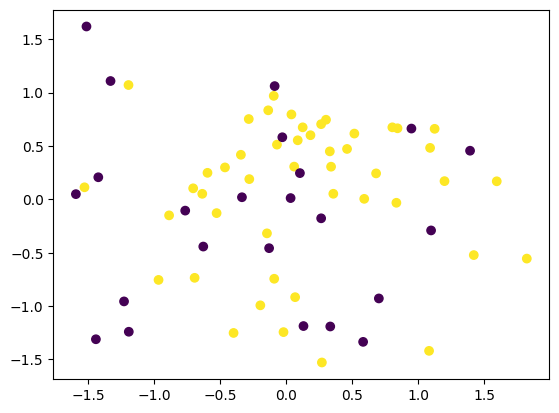

In [65]:
plt.show()

In [67]:
from functional.dimension import mle, mm, pca, two_nn
from utils.math import mle_aggregate

mle_aggregate(mle(p, 5)), mm(p, 5).mean(), mle_aggregate(mle(p, 10)), mm(p, 10).mean(), pca(p), two_nn(p)

(2.1501836580944027,
 3.2269004784719666,
 2.106962442840457,
 2.647893900865255,
 2,
 2.3618583392911408)

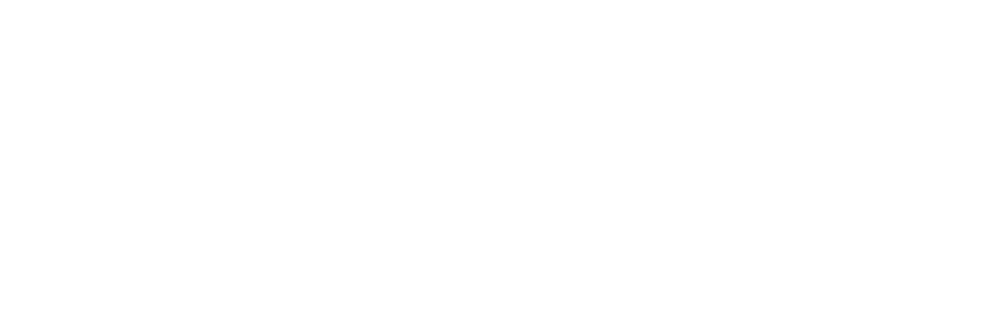

In [70]:
from gtda.plotting import plot_point_cloud

p = PCA(n_components=3).fit_transform(X)

plot_point_cloud(p, plotly_params=dict(color=labels))

In [71]:
import librosa

In [72]:
w = np.load('waveforms.npy')
w.shape

(1395, 40000)

In [75]:
spec = librosa.feature.melspectrogram(y=w[0])
plt.imshow(spec)

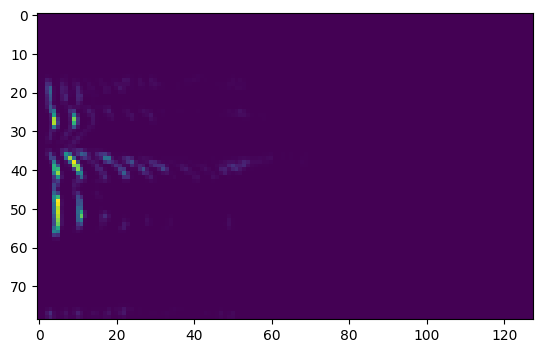

In [77]:
plt.imshow(spec.T)
plt.show()

In [79]:
plt.imshow(spec.T)
plt.savefig('spec.png')

In [92]:
le, ce = torch.load('whisper_lang.pt').numpy().astype('float32'), torch.load('whisper_char.pt').numpy().astype('float32')

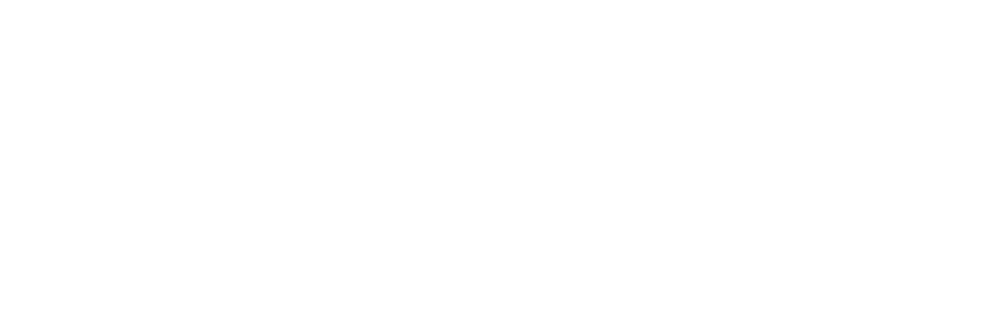

In [95]:
t = PCA(n_components=3).fit_transform(le)
plot_point_cloud(t)

In [94]:
np.unique(le, axis=-2).shape

(99, 768)

In [97]:
le[0].max()

5.4726562

In [99]:
PCA(n_components=0.95).fit(le).n_components_

2

In [101]:
from scipy.spatial.distance import pdist

pdist(le).min()

0.3561489699793944

In [103]:
type(emb)

numpy.ndarray

In [111]:
dim = 11
n_neighbors = 11

embeddings = {
    "Random projection embedding": SparseRandomProjection(
        n_components=dim, random_state=42
    ),
    "Truncated SVD embedding": TruncatedSVD(n_components=dim),
    "Linear Discriminant Analysis embedding": LinearDiscriminantAnalysis(
        n_components=dim
    ),
    "Isomap embedding": Isomap(n_neighbors=n_neighbors, n_components=dim),
    "Standard LLE embedding": LocallyLinearEmbedding(
        n_neighbors=n_neighbors, n_components=dim, method="standard"
    ),
    "Modified LLE embedding": LocallyLinearEmbedding(
        n_neighbors=n_neighbors, n_components=dim, method="modified"
    ),
    "MDS embedding": MDS(n_components=dim, n_init=1, max_iter=120, n_jobs=2),
    "Random Trees embedding": make_pipeline(
        RandomTreesEmbedding(n_estimators=200, max_depth=5, random_state=0),
        TruncatedSVD(n_components=dim),
    ),
    "Spectral embedding": SpectralEmbedding(
        n_components=dim, random_state=0, eigen_solver="arpack"
    ),
    "t-SNE embedding": TSNE(
        n_components=dim,
        n_iter=500,
        n_iter_without_progress=150,
        n_jobs=2,
        random_state=0,
    ),
    "NCA embedding": NeighborhoodComponentsAnalysis(
        n_components=dim, init="pca", random_state=0
    ),
}

X, y = model.encoder.embed_tokens.weight.numpy(force=True), np.load('vowel_labels.npy')
n_samples, n_features = X.shape

projections = {}
for name, transformer in embeddings.items():
    try:
        print(f"Computing {name}...")
        projections[name] = transformer.fit_transform(X)
    except:
        continue

for name, p in projections.items():
    print(name, p.shape)

Computing Random projection embedding...
Computing Truncated SVD embedding...
Computing Linear Discriminant Analysis embedding...
Computing Isomap embedding...
Computing Standard LLE embedding...
Computing Modified LLE embedding...
Computing MDS embedding...


/Users/andrew/PycharmProjects/tadProject/.venv/lib/python3.9/site-packages/sklearn/manifold/_locally_linear.py:486: RuntimeWarning:

invalid value encountered in scalar divide



Computing Random Trees embedding...
Computing Spectral embedding...
Computing t-SNE embedding...
Computing NCA embedding...
Random projection embedding (74, 11)
Truncated SVD embedding (74, 11)
Isomap embedding (74, 11)
Standard LLE embedding (74, 11)
Modified LLE embedding (74, 11)
MDS embedding (74, 11)
Random Trees embedding (74, 11)
Spectral embedding (74, 11)


In [114]:
for name, p in projections.items():
    X_train, X_valid, y_train, y_valid = train_test_split(p[4:], y)
    print(f'{name}:', RandomForestClassifier().fit(X_train, y_train).score(X_valid, y_valid))

Random projection embedding: 0.5555555555555556
Truncated SVD embedding: 0.6111111111111112
Isomap embedding: 0.6111111111111112
Standard LLE embedding: 0.8333333333333334
Modified LLE embedding: 0.4444444444444444
MDS embedding: 0.7222222222222222
Random Trees embedding: 0.5555555555555556
Spectral embedding: 0.6666666666666666


In [115]:
for name, p in projections.items():
    X_train, X_valid, y_train, y_valid = train_test_split(X[4:], y)
    print(f'{name}:', RandomForestClassifier().fit(X_train, y_train).score(X_valid, y_valid))

Random projection embedding: 0.6666666666666666
Truncated SVD embedding: 0.6111111111111112
Isomap embedding: 0.6666666666666666
Standard LLE embedding: 0.7222222222222222
Modified LLE embedding: 0.6666666666666666
MDS embedding: 0.7222222222222222
Random Trees embedding: 0.4444444444444444
Spectral embedding: 0.6111111111111112


In [116]:
from sklearn.neighbors import KNeighborsClassifier

for name, p in projections.items():
    X_train, X_valid, y_train, y_valid = train_test_split(p[4:], y)
    print(f'{name}:', KNeighborsClassifier(11).fit(X_train, y_train).score(X_valid, y_valid))

Random projection embedding: 0.7222222222222222
Truncated SVD embedding: 0.6111111111111112
Isomap embedding: 0.6666666666666666
Standard LLE embedding: 0.6666666666666666
Modified LLE embedding: 0.1111111111111111
MDS embedding: 0.5555555555555556
Random Trees embedding: 0.7222222222222222
Spectral embedding: 0.7222222222222222


In [117]:
from sklearn.svm import SVC

for name, p in projections.items():
    X_train, X_valid, y_train, y_valid = train_test_split(p[4:], y)
    print(f'{name}:', SVC().fit(X_train, y_train).score(X_valid, y_valid))

Random projection embedding: 0.6666666666666666
Truncated SVD embedding: 0.5555555555555556
Isomap embedding: 0.7222222222222222
Standard LLE embedding: 0.9444444444444444
Modified LLE embedding: 0.7777777777777778
MDS embedding: 0.5555555555555556
Random Trees embedding: 0.7222222222222222
Spectral embedding: 0.8333333333333334


In [118]:
for name, p in projections.items():
    X_train, X_valid, y_train, y_valid = train_test_split(p[4:], y)
    print(f'{name}:', SVC(kernel='linear').fit(X_train, y_train).score(X_valid, y_valid))

Random projection embedding: 0.7222222222222222
Truncated SVD embedding: 0.6111111111111112
Isomap embedding: 0.7777777777777778
Standard LLE embedding: 0.5555555555555556
Modified LLE embedding: 0.6666666666666666
MDS embedding: 0.6666666666666666
Random Trees embedding: 0.5
Spectral embedding: 0.6111111111111112


In [119]:
X = model.encoder.embed_speaker.weight.numpy(force=True)

In [120]:
X.shape

(200, 64)

In [123]:
from sklearn.cluster import DBSCAN, SpectralClustering, AffinityPropagation
from sklearn import metrics

In [127]:
np.quantile(pdist(X), 0.1)

10.238222097080856

In [138]:
DBSCAN(eps=12).fit(X).labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0])

In [140]:
AffinityPropagation().fit(X).labels_

array([14,  4, 12,  3, 11,  4,  3,  3,  0, 16, 16, 16, 11,  5, 14, 12,  1,
        8, 12, 16, 11, 16, 12,  6,  1,  3,  2, 16, 12, 11,  1,  7, 13,  9,
        3,  7, 13, 12, 15, 12, 16,  4,  6, 15,  5, 12, 12,  7,  3,  8,  6,
        5, 10, 16, 12,  0,  4,  9, 16, 12,  5, 12,  8, 16, 13,  2,  6, 16,
        5, 15,  7,  6, 10, 10,  8, 10,  6, 10,  5,  5, 12, 16, 12, 16, 13,
        6, 12, 10,  6, 16,  8,  7,  3, 13,  4,  9,  6,  8,  9,  0, 16, 10,
        5, 14, 12, 12,  2,  8, 13, 10, 14, 12,  5, 11, 10,  5,  3, 15, 14,
       11, 12, 16,  4, 15,  6, 12, 12, 16, 13,  5,  2, 12, 12,  6,  7, 13,
       13, 15, 10, 14, 12, 14,  1, 12, 12,  7,  8, 14, 11,  4,  0,  5, 16,
        2, 12,  5,  3,  5,  5, 11,  5,  3,  7,  6, 12,  8,  0, 11,  6, 11,
       14, 15, 12, 16,  1,  3, 12, 16, 15,  5, 12,  7, 16,  4,  5,  0, 10,
        7, 13, 16, 10,  5, 13, 10, 11, 16,  5,  5, 10, 12])

In [141]:
SpectralClustering().fit(X).labels_

array([4, 5, 1, 1, 1, 5, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 4, 1, 0, 4, 3, 1, 1, 0, 3, 1, 1, 1, 1, 1, 5, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 5, 1, 1, 1, 1, 1, 1, 1, 3, 1,
       1, 1, 1, 5, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 3, 1, 4, 5, 1, 1, 1, 1, 2, 1, 1, 1, 4, 1, 1, 1, 2, 4, 1,
       1, 4, 1, 1, 7, 1, 4, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 3, 6, 5, 1, 1, 1, 1, 0, 3, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 4, 3, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1], dtype=int32)

In [139]:
metrics.silhouette_score(X, DBSCAN(eps=12).fit(X).labels_, metric='euclidean')

ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

In [143]:
from gtda.homology import VietorisRipsPersistence

VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2])
Xt = VR.fit_transform(X.reshape(1, *X.shape))
Xt.shape

(1, 1039, 3)

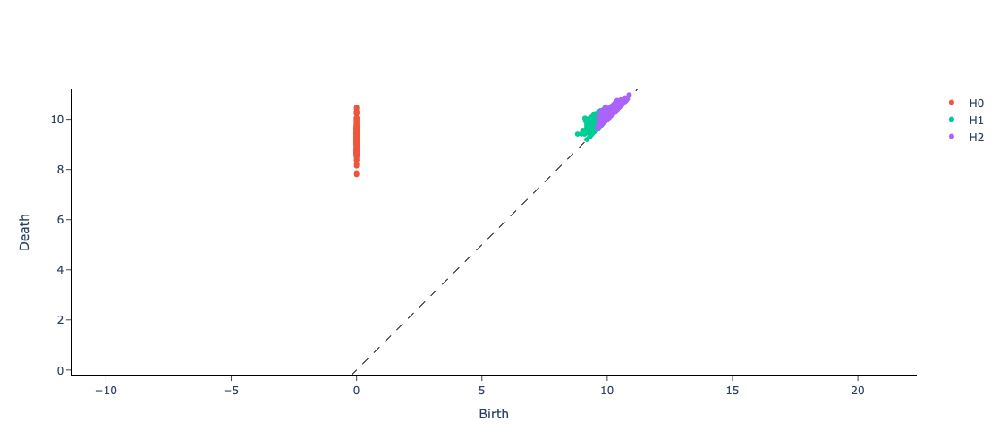

In [145]:
plot_diagram(Xt[0])

In [147]:
import pandas as pd

pd.Series([1, 2, 3]).value_counts()

1    1
2    1
3    1
Name: count, dtype: int64

In [148]:
X.shape

(200, 64)

In [149]:
dim = 20
n_neighbors = 20

embeddings = {
    "Random projection embedding": SparseRandomProjection(
        n_components=dim, random_state=42
    ),
    "Truncated SVD embedding": TruncatedSVD(n_components=dim),
    "Linear Discriminant Analysis embedding": LinearDiscriminantAnalysis(
        n_components=dim
    ),
    "Isomap embedding": Isomap(n_neighbors=n_neighbors, n_components=dim),
    "Standard LLE embedding": LocallyLinearEmbedding(
        n_neighbors=n_neighbors, n_components=dim, method="standard"
    ),
    "Modified LLE embedding": LocallyLinearEmbedding(
        n_neighbors=n_neighbors, n_components=dim, method="modified"
    ),
    "MDS embedding": MDS(n_components=dim, n_init=1, max_iter=120, n_jobs=2),
    "Random Trees embedding": make_pipeline(
        RandomTreesEmbedding(n_estimators=200, max_depth=5, random_state=0),
        TruncatedSVD(n_components=dim),
    ),
    "Spectral embedding": SpectralEmbedding(
        n_components=dim, random_state=0, eigen_solver="arpack"
    ),
    "t-SNE embedding": TSNE(
        n_components=dim,
        n_iter=500,
        n_iter_without_progress=150,
        n_jobs=2,
        random_state=0,
    ),
    "NCA embedding": NeighborhoodComponentsAnalysis(
        n_components=dim, init="pca", random_state=0
    ),
}

In [150]:
projections = {}
for name, transformer in embeddings.items():
    try:
        print(f"Computing {name}...")
        projections[name] = transformer.fit_transform(X)
    except:
        continue

for name, p in projections.items():
    print(name, p.shape)

Computing Random projection embedding...
Computing Truncated SVD embedding...
Computing Linear Discriminant Analysis embedding...
Computing Isomap embedding...
Computing Standard LLE embedding...
Computing Modified LLE embedding...
Computing MDS embedding...


/Users/andrew/PycharmProjects/tadProject/.venv/lib/python3.9/site-packages/sklearn/manifold/_locally_linear.py:486: RuntimeWarning:

invalid value encountered in scalar divide



Computing Random Trees embedding...
Computing Spectral embedding...
Computing t-SNE embedding...
Computing NCA embedding...
Random projection embedding (200, 20)
Truncated SVD embedding (200, 20)
Isomap embedding (200, 20)
Standard LLE embedding (200, 20)
Modified LLE embedding (200, 20)
MDS embedding (200, 20)
Random Trees embedding (200, 20)
Spectral embedding (200, 20)


In [151]:
for name, p in projections.items():
    print(name, pdist(p).min())

Random projection embedding 5.0499361827748315
Truncated SVD embedding 4.1286030466149946
Isomap embedding 7.515144468120346
Standard LLE embedding 0.15042888419936393
Modified LLE embedding 0.0
MDS embedding 6.116118250815681
Random Trees embedding 3.93920109540517
Spectral embedding 0.03937703541784215


In [155]:
for i, (name, p) in enumerate(projections.items()):
    plt.subplot(len(projections), 3, i + 1)
    plot_diagram(VR.fit_transform(p.reshape(1, *p.shape))[0])
    eps = pdist(p).min()
    print('\n', name)
    print(pd.Series(DBSCAN(eps + 0.0001).fit(p).labels_).value_counts())
    print(pd.Series(AffinityPropagation().fit(p).labels_).value_counts())
    print(pd.Series(SpectralClustering().fit(p).labels_).value_counts())


 Random projection embedding
-1    200
Name: count, dtype: int64
9     24
13    17
5     16
2     14
16    14
7     13
15    12
14    11
11    10
0     10
6     10
12     9
8      8
10     7
1      7
17     7
3      6
4      5
Name: count, dtype: int64
0    189
3      3
5      2
7      2
4      1
6      1
1      1
2      1
Name: count, dtype: int64

 Truncated SVD embedding
-1    200
Name: count, dtype: int64
6     21
5     20
3     19
12    17
9     16
8     16
2     14
11    14
1     13
14    12
13     9
10     9
4      9
7      6
0      5
Name: count, dtype: int64
0    104
3     53
7     17
6     14
1      5
4      3
2      2
5      2
Name: count, dtype: int64

 Isomap embedding
-1    200
Name: count, dtype: int64
10    23
2     17
8     13
16    13
4     13
11    13
14    11
12    11
1     10
18     9
3      9
13     9
6      9
0      9
5      8
17     7
15     6
9      5
7      5
Name: count, dtype: int64
2    193
7      1
1      1
6      1
4      1
3      1
5      1
0      1
Nam

In [158]:
plt.figure(figsize=(8, 15))
fig, axes = plt.subplots(len(projections), 3)

for i, (name, p) in enumerate(projections.items()):
    plt.subplot(len(projections), 3, i + 1)
    plot_diagram(VR.fit_transform(p.reshape(1, *p.shape))[0])

plt.show()

ValueError: Single argument to subplot must be a three-digit integer, not 1

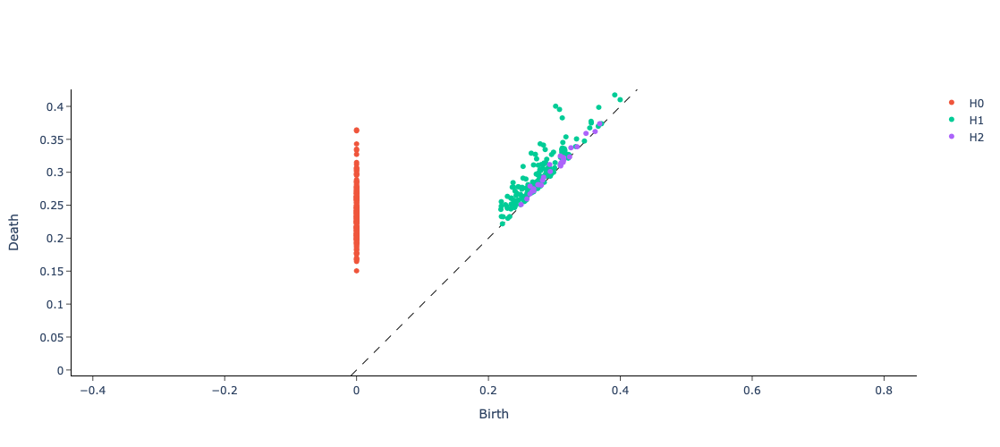

In [162]:
ps = list(projections.values())
p = ps[3]
plot_diagram(VR.fit_transform(p.reshape(1, *p.shape))[0])

In [167]:
list(projections.keys())[3]

'Standard LLE embedding'

In [168]:
from utils.tensorboard import plot_andrews

In [170]:
labels = np.load('vowel_labels.npy')
labels.shape

(70,)

In [173]:
X = model.encoder.embed_tokens.weight.numpy(force=True)[4:]
X.shape

(70, 256)

/var/folders/gj/6k0s5jts7dv8ygp7t_n5nch80000gn/T/ipykernel_69019/1846680289.py:7: UserWarning:

Legend does not support handles for Axes instances.
A proxy artist may be used instead.
See: https://matplotlib.org/stable/users/explain/axes/legend_guide.html#controlling-the-legend-entries



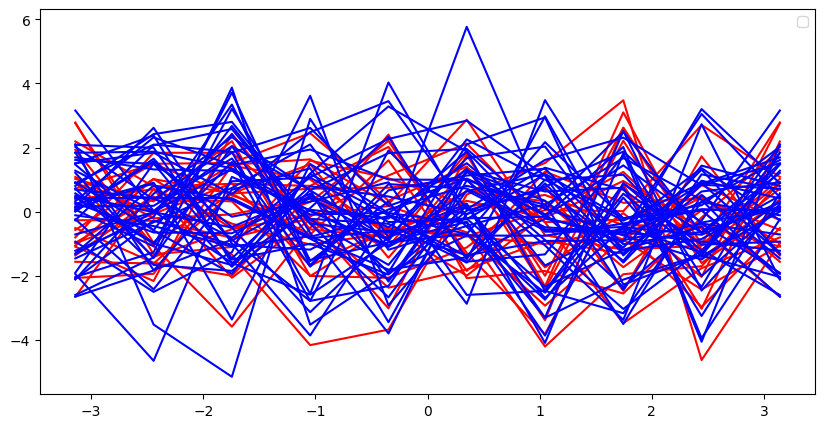

In [181]:
fig = plt.figure(figsize=(10, 5))
ax = plt.subplot(111)

line1 = plot_andrews(X[labels == 0], ax, 'r', 10)
line2 = plot_andrews(X[labels == 1], ax, 'b', 10)

ax.legend([line1, line2], ['Consonants', 'Vowels'])
plt.show()

In [186]:
a1, a2, a3, a4 = [torch.load(f'attention/54_attention_{i}.pt').squeeze().numpy().astype('float32') for i in range(4)]

In [187]:
a1.shape, a3.shape

((54, 54), (54, 54))

In [188]:
from scipy.spatial.distance import cdist
from functional.information import hellinger, multinomial_geodesic

d1, d2, d3, d4 = cdist(a1, a1, hellinger), cdist(a2, a2, hellinger), cdist(a3, a3, hellinger), cdist(a4, a4, hellinger)
d1.shape

(54, 54)

### Hellinger

In [214]:
from functional.dimension import mle, mm, two_nn
from utils.math import mle_aggregate

In [213]:
for l in (54, 117, 150):
    print('Dimension for length', l)
    for i, a in enumerate([torch.load(f'attention/{l}_attention_{i}.pt').squeeze().numpy().astype('float32') for i in range(4)]):
        d = cdist(a, a, hellinger)
        print(f'Layer {i}:', mle_aggregate(mle(d, 10, distances=True)), mm(d, 10, distances=True).mean(), two_nn(d, distances=True))

Dimension for length 54
Layer 0: 1.8733986564207603 5.713077790921769 1.417669248491107
Layer 1: 3.024357721506318 5.356296889648987 3.416068313677586
Layer 2: 1.7056991336684506 3.00725515399845 3.664644316281334
Layer 3: 9.273227902818412 11.389032044178018 9.604767610331065
Dimension for length 117
Layer 0: 1.5269869843447375 4.135305982311736 2.606442480224738
Layer 1: 4.349297706512994 6.087533305019128 6.362876753386609
Layer 2: 2.9925813311811034 11.955246752324138 4.6117126683499405
Layer 3: 11.475492756225684 14.609729761864465 12.592970768282974
Dimension for length 150
Layer 0: 1.4888115136813487 3.689073704527174 2.4350679934757555
Layer 1: 4.749122225369356 6.699912173470863 5.176694670350598
Layer 2: 2.8742882307378204 5.294866715387692 6.104731002582292
Layer 3: 10.741049413106275 14.826079421467503 9.692051708824227


In [218]:
from functional.magnitude import magnitude

for l in (54, 117, 150):
    print('Magnitude for length', l)
    for i, a in enumerate([torch.load(f'attention/{l}_attention_{i}.pt').squeeze().numpy().astype('float32') for i in range(4)]):
        d = cdist(a, a, hellinger)
        print(f'Layer {i}:', magnitude(d, distances=True))

Magnitude for length 54
Layer 0: 1.6420856272277682
Layer 1: 2.571133835064555
Layer 2: 2.6204648991182613
Layer 3: 1.7892208301153936
Magnitude for length 117
Layer 0: 1.6901129828199881
Layer 1: 2.668032484138892
Layer 2: 2.769495081344589
Layer 3: 1.982136507010493
Magnitude for length 150
Layer 0: 1.694405856050757
Layer 1: 2.6970208083052274
Layer 2: 2.768472866477586
Layer 3: 1.9607859815519404


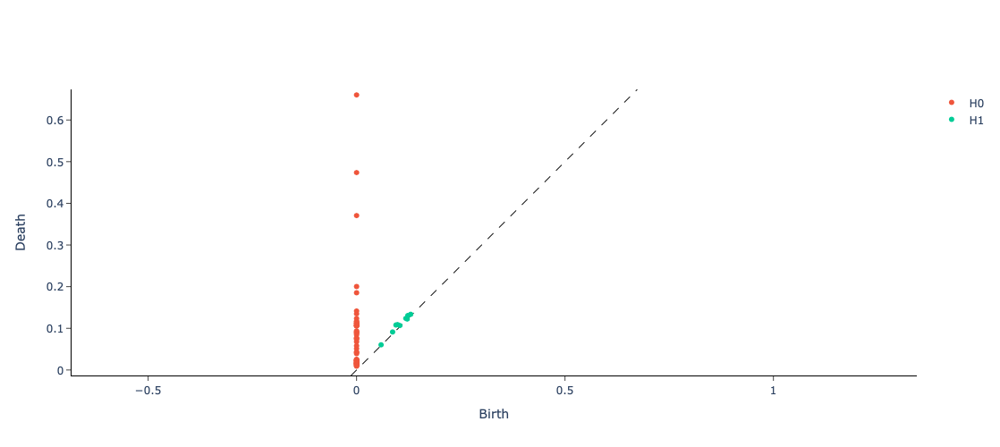

In [225]:
d = cdist(a1, a1, hellinger)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

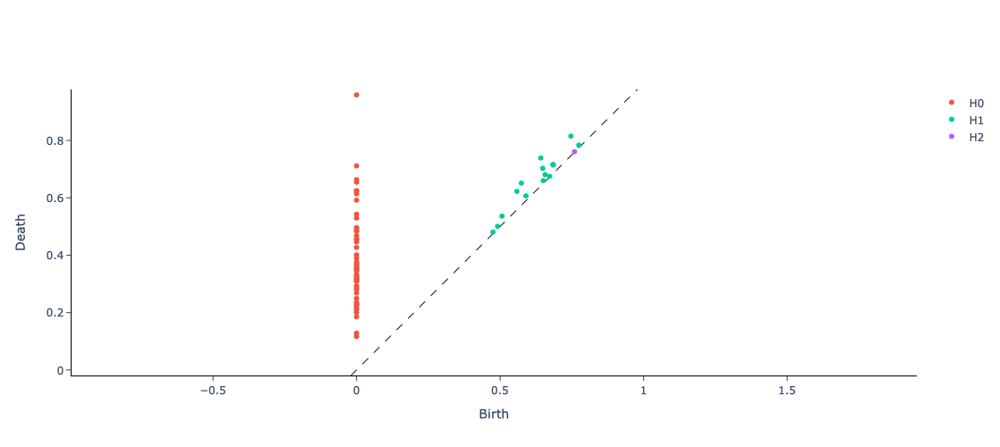

In [226]:
d = cdist(a2, a2, hellinger)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

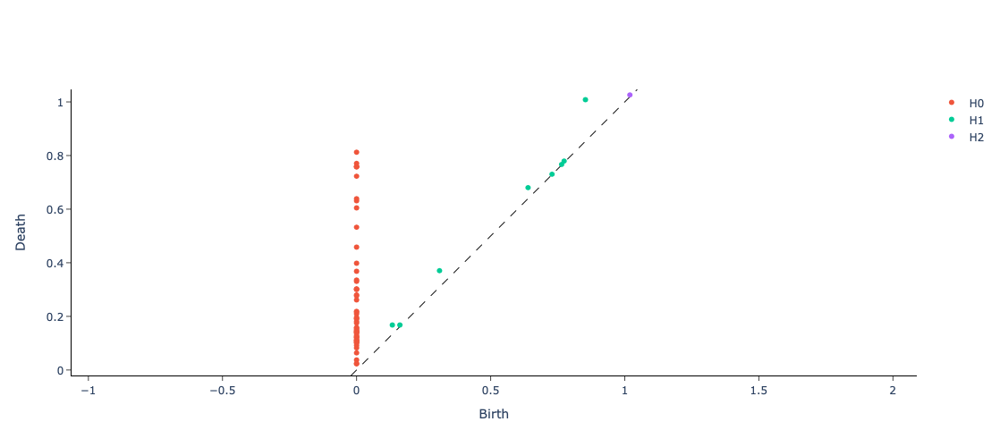

In [227]:
d = cdist(a3, a3, hellinger)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

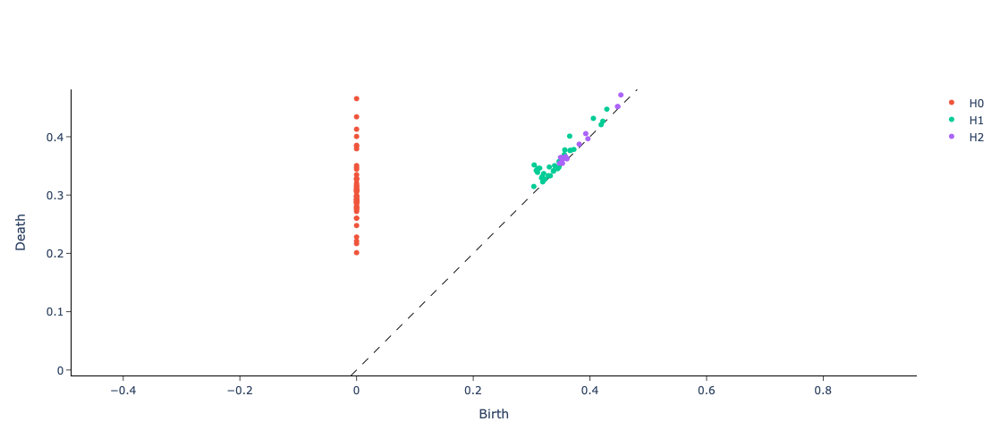

In [228]:
d = cdist(a4, a4, hellinger)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

### Geodesic

In [208]:
def multinomial_geodesic(P: np.ndarray, Q: np.ndarray) -> float:
    return 2 * np.arccos(max(min(np.sqrt(P * Q).sum(), 1), -1))

In [215]:
for l in (54, 117, 150):
    print('Dimension for length', l)
    for i, a in enumerate([torch.load(f'attention/{l}_attention_{i}.pt').squeeze().numpy().astype('float32') for i in range(4)]):
        d = cdist(a, a, multinomial_geodesic)
        print(f'Layer {i}:', mle_aggregate(mle(d, 10, distances=True)), mm(d, 10, distances=True).mean(), two_nn(d, distances=True))

Dimension for length 54
Layer 0: 1.8714666165364648 5.666882360619861 1.4145869724685354
Layer 1: 2.949630494553205 5.143680709509234 3.391175280162775
Layer 2: 1.6767083387887605 2.920634067627886 3.6507324349613106
Layer 3: 9.168892614870456 11.25548304974127 9.542045095317773
Dimension for length 117
Layer 0: 1.5249892401189897 4.130053649376492 2.6058954028263037
Layer 1: 4.272555150092399 5.9615000403457845 6.322401577657308
Layer 2: 2.963733286160666 11.505127552829286 4.5817787273548385
Layer 3: 11.335761916559042 14.431072172869277 12.484445107718141
Dimension for length 150
Layer 0: 1.487381698444809 3.685524981415943 2.4346182877762215
Layer 1: 4.678312171586086 6.597405057907032 5.136104621698748
Layer 2: 2.8470769011212322 5.207727249495553 6.079033322143673
Layer 3: 10.621331995954003 14.655173504113202 9.628959610903406


In [217]:
from functional.magnitude import magnitude

for l in (54, 117, 150):
    print('Magnitude for length', l)
    for i, a in enumerate([torch.load(f'attention/{l}_attention_{i}.pt').squeeze().numpy().astype('float32') for i in range(4)]):
        d = cdist(a, a, multinomial_geodesic)
        print(f'Layer {i}:', magnitude(d, distances=True))

Magnitude for length 54
Layer 0: 2.4557490800161026
Layer 1: 5.94135036732597
Layer 2: 6.003001867354487
Layer 3: 3.0046493677215445
Magnitude for length 117
Layer 0: 2.599811226404924
Layer 1: 6.439817342738836
Layer 2: 6.924606187445374
Layer 3: 3.650185002803153
Magnitude for length 150
Layer 0: 2.6166876470567875
Layer 1: 6.58515285196982
Layer 2: 6.8841501603751105
Layer 3: 3.590808699660724


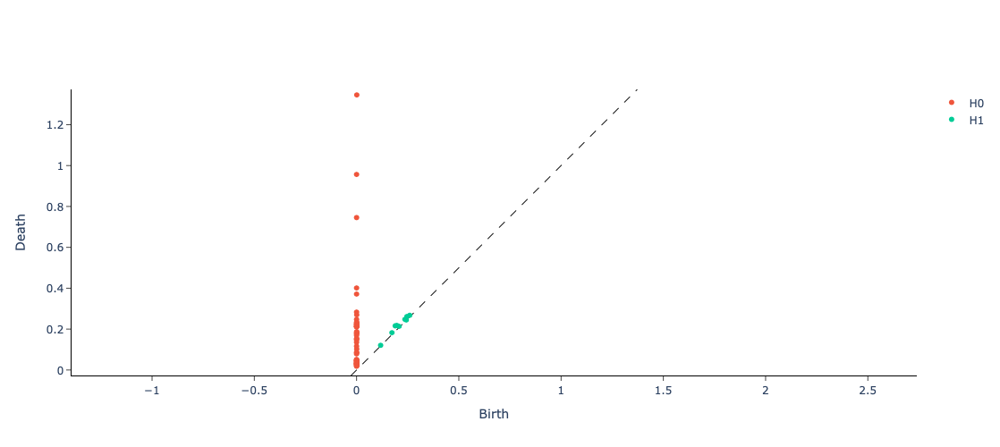

In [221]:
d = cdist(a1, a1, multinomial_geodesic)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

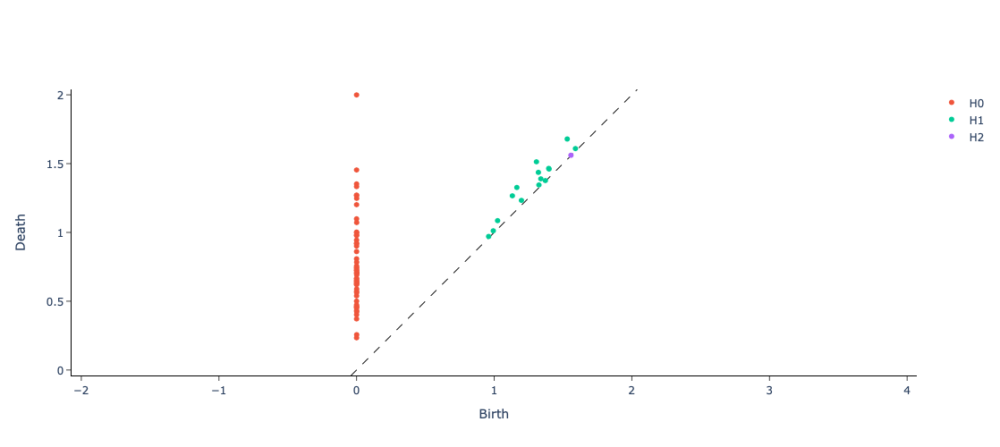

In [222]:
d = cdist(a2, a2, multinomial_geodesic)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

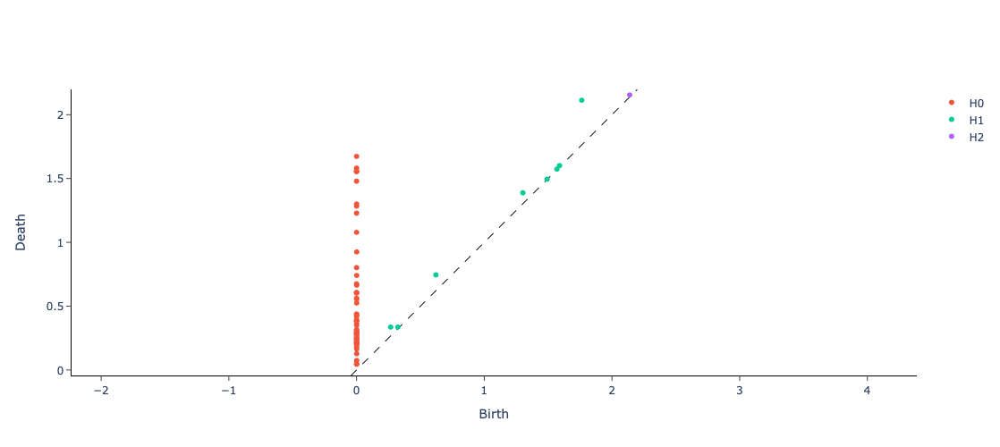

In [223]:
d = cdist(a3, a3, multinomial_geodesic)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

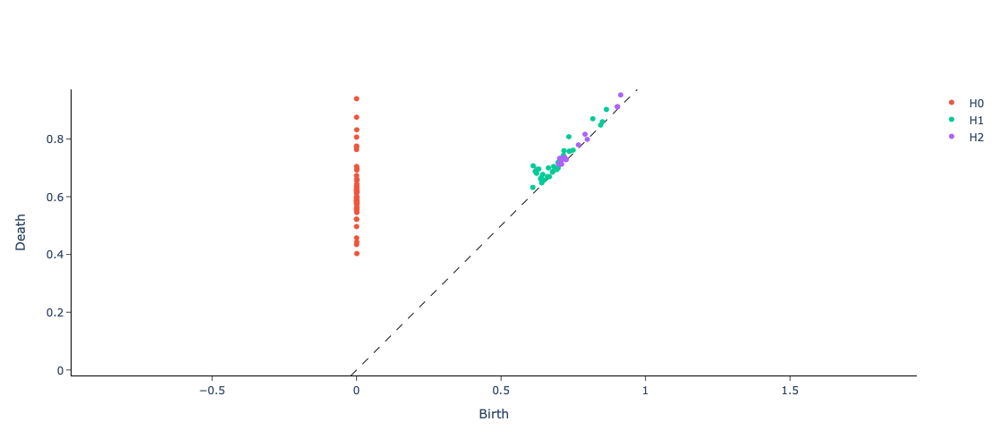

In [224]:
d = cdist(a4, a4, multinomial_geodesic)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

### Plot 2nn dimension

In [3]:
from functional.dimension import two_nn
from functional.information import hellinger
import torch
from scipy.spatial.distance import cdist

for l in (54, 117, 150):
    print('Dimension for length', l)
    for i, a in enumerate([torch.load(f'attention/{l}_attention_{i}.pt').squeeze().numpy().astype('float32') for i in range(4)]):
        d = cdist(a, a, hellinger)
        print(f'Layer {i}:', two_nn(d, distances=True))

Dimension for length 54
Layer 0: 1.417669248491107
Layer 1: 3.416068313677586
Layer 2: 3.664644316281334
Layer 3: 9.604767610331065
Dimension for length 117
Layer 0: 2.606442480224738
Layer 1: 6.362876753386609
Layer 2: 4.6117126683499405
Layer 3: 12.592970768282974
Dimension for length 150
Layer 0: 2.4350679934757555
Layer 1: 5.176694670350598
Layer 2: 6.104731002582292
Layer 3: 9.692051708824227


In [5]:
import numpy as np
from functional.magnitude import magnitude

A = np.zeros((3, 2, 4))

for j, l in enumerate((54, 117, 150)):
    for i, a in enumerate([torch.load(f'attention/{l}_attention_{i}.pt').squeeze().numpy().astype('float32') for i in range(4)]):
        d = cdist(a, a, hellinger)
        A[j, 0, i] = two_nn(d, distances=True)
        A[j, 1, i] = magnitude(d, distances=True)
A

array([[[ 1.41766925,  3.41606831,  3.66464432,  9.60476761],
        [ 1.64208563,  2.57113384,  2.6204649 ,  1.78922083]],

       [[ 2.60644248,  6.36287675,  4.61171267, 12.59297077],
        [ 1.69011298,  2.66803248,  2.76949508,  1.98213651]],

       [[ 2.43506799,  5.17669467,  6.104731  ,  9.69205171],
        [ 1.69440586,  2.69702081,  2.76847287,  1.96078598]]])

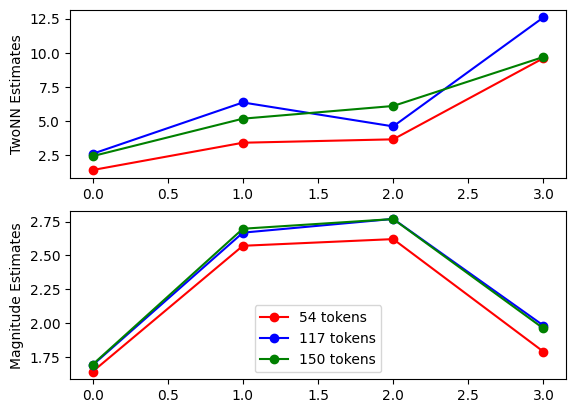

In [10]:
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(2, 1)
ax1.plot(A[0, 0, :], 'o-', c='r', label='54 tokens')
ax1.plot(A[1, 0, :], 'o-', c='b', label='117 tokens')
ax1.plot(A[2, 0, :], 'o-', c='g', label='150 tokens')
ax1.set_ylabel('TwoNN Estimates')

ax2.plot(A[0, 1, :], 'o-', c='r', label='54 tokens')
ax2.plot(A[1, 1, :], 'o-', c='b', label='117 tokens')
ax2.plot(A[2, 1, :], 'o-', c='g', label='150 tokens')
ax2.set_ylabel('Magnitude Estimates')

plt.legend()

plt.savefig('attention.png')

In [9]:
plt.savefig('attention.png')

<Figure size 640x480 with 0 Axes>

In [11]:
a1, a2, a3, a4 = [torch.load(f'attention/117_attention_{i}.pt').squeeze().numpy().astype('float32') for i in range(4)]

In [12]:
from gtda.homology import VietorisRipsPersistence
from gtda.plotting import plot_diagram

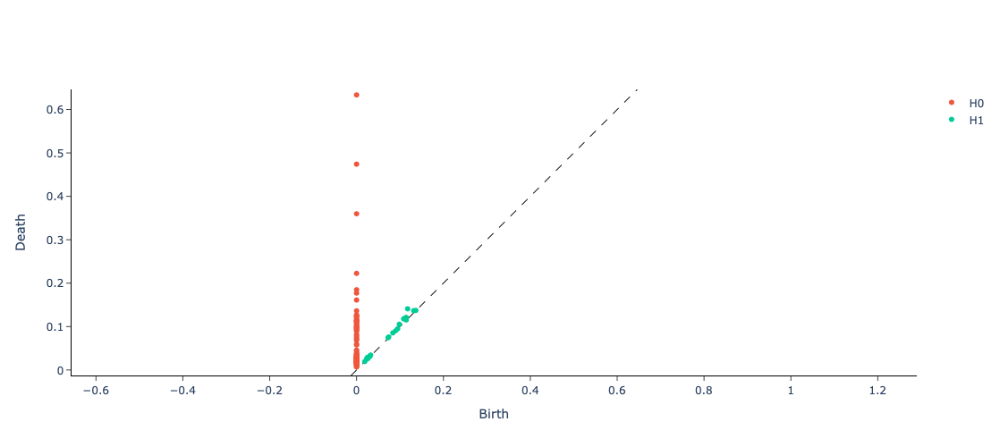

In [13]:
d = cdist(a1, a1, hellinger)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

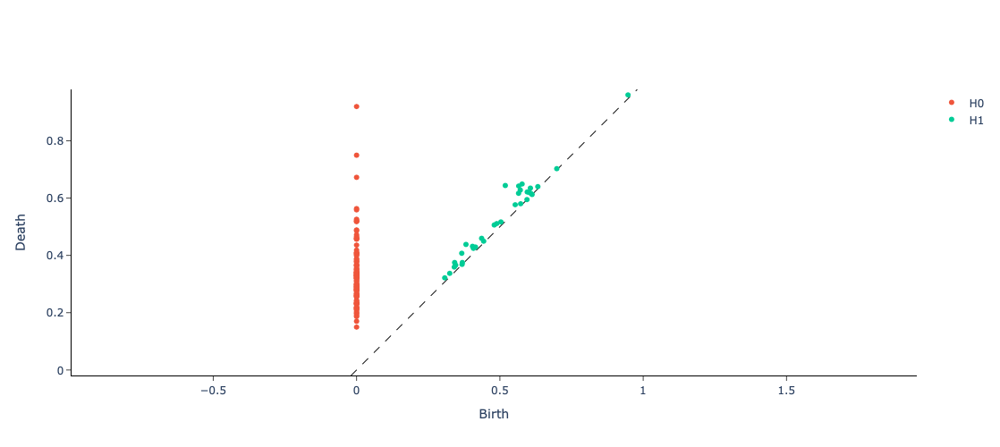

In [14]:
d = cdist(a2, a2, hellinger)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

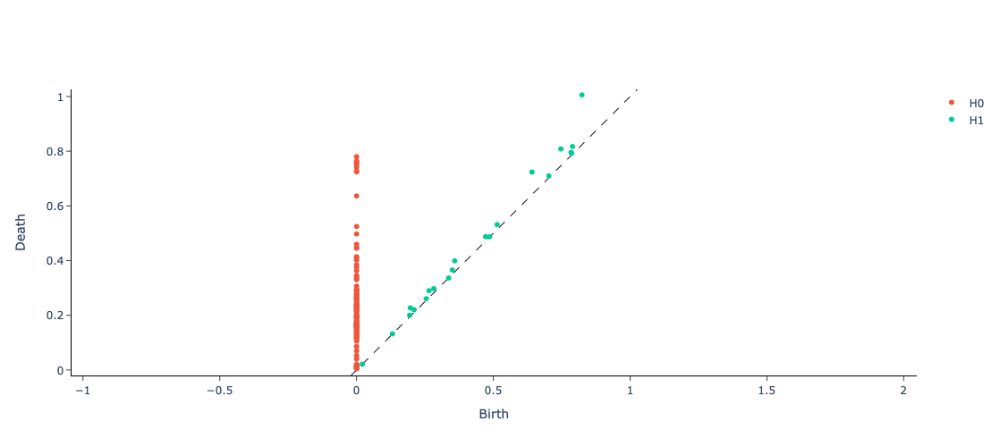

In [15]:
d = cdist(a3, a3, hellinger)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

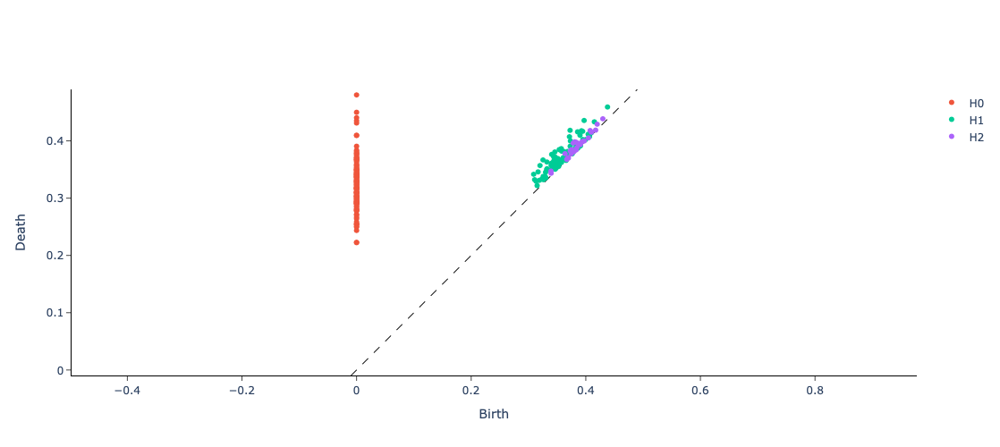

In [16]:
d = cdist(a4, a4, hellinger)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

In [17]:
a1, a2, a3, a4 = [torch.load(f'attention/150_attention_{i}.pt').squeeze().numpy().astype('float32') for i in range(4)]

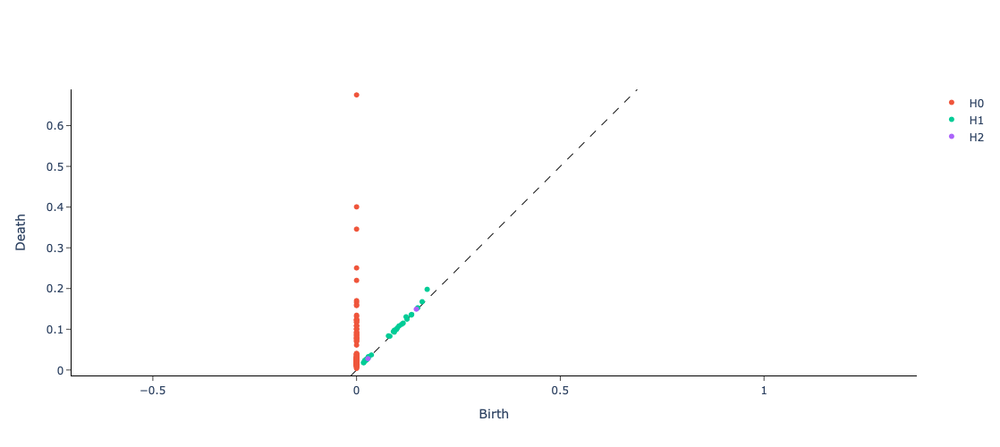

In [18]:
d = cdist(a1, a1, hellinger)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

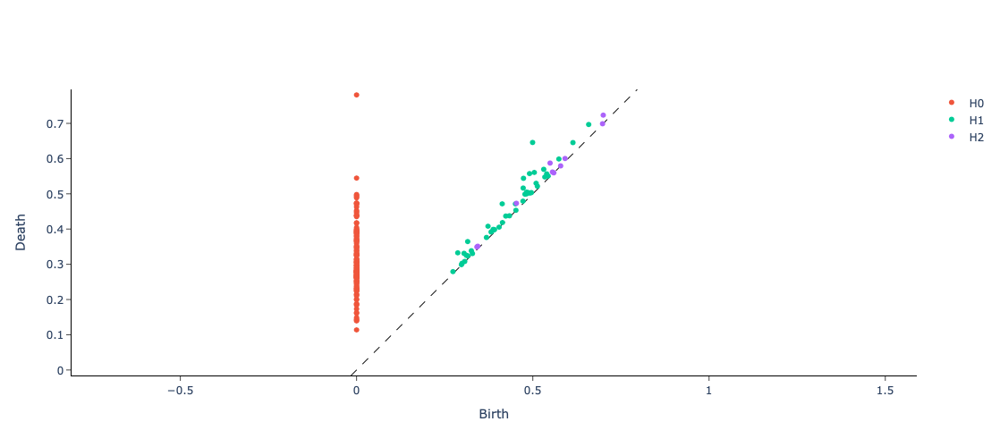

In [19]:
d = cdist(a2, a2, hellinger)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

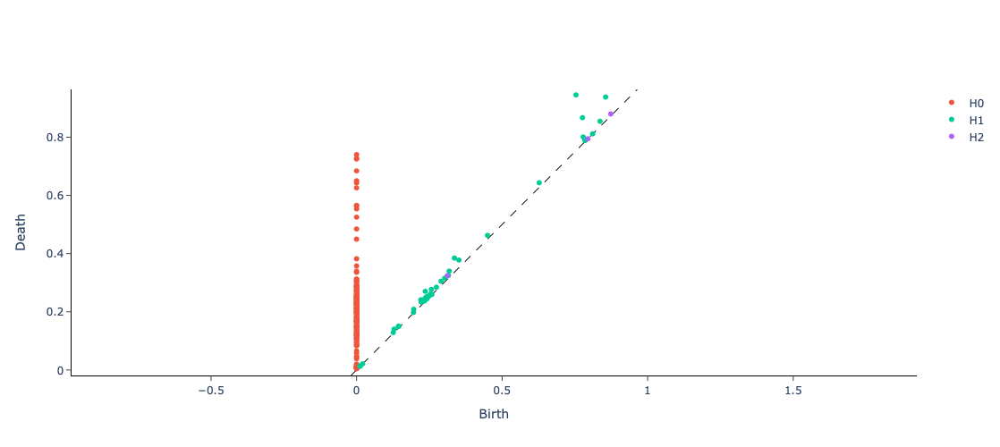

In [20]:
d = cdist(a3, a3, hellinger)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])

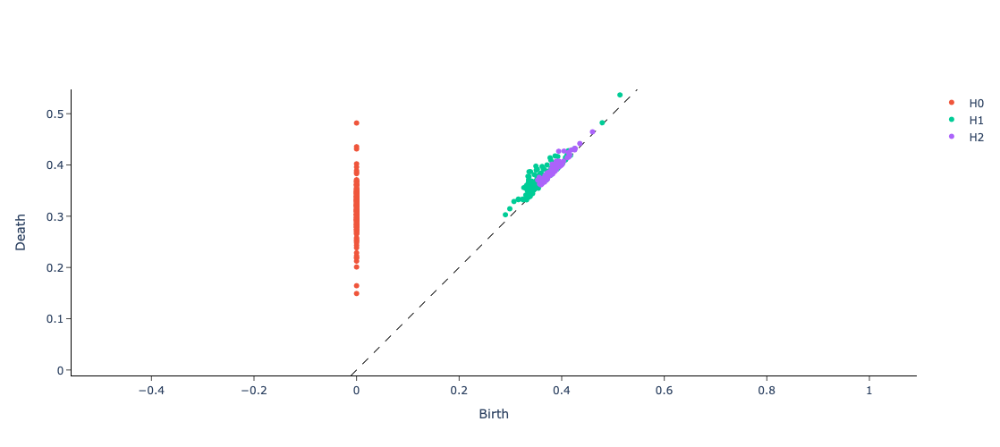

In [21]:
d = cdist(a4, a4, hellinger)
VR = VietorisRipsPersistence(homology_dimensions=[0, 1, 2], metric='precomputed')
dt = VR.fit_transform(d.reshape(1, *d.shape))
plot_diagram(dt[0])